In [ ]:
#@title ##### License { display-mode: "form" }
# Copyright 2019 DeepMind Technologies Ltd. All rights reserved.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# OpenSpiel

* This Colab gets you started with installing OpenSpiel and its dependencies.
* OpenSpiel is a framework for reinforcement learning in games.
* The instructions are adapted from [here](https://github.com/deepmind/open_spiel/blob/master/docs/install.md).

## Install

Install OpenSpiel via pip:


In [ ]:
!pip install --upgrade open_spiel

# It's play time!

In [1]:
import numpy as np
import pyspiel

game = pyspiel.load_game("tic_tac_toe")
state = game.new_initial_state()

while not state.is_terminal():
  state.apply_action(np.random.choice(state.legal_actions()))
  print(str(state) + '\n')

ModuleNotFoundError: No module named 'pyspiel'

In [2]:
#####

In [ ]:
# ==========================================
# Script #2: OMWU / EO / EOO / L Hyperparameter Explorer (Toy 2x2 game)
# - Uniform starts
# - η sweep: 0.01 .. 1.00 (step 0.01)
# - For EO / EOO / L: L ∈ {2,3,4,5} (skip L=1 to avoid duplicating OMWU)
# - Extra-optimism first step rule: at t=0 use d0 = 3 * g0  (EO / EOO / L only)
# - After each run: Phase plot + Log–log gap plot
# - After each variant: report + replot best run (fewest steps to T2)
# - End: overlay of best gap curves across variants
# ==========================================

import numpy as np
import matplotlib.pyplot as plt
from dataclasses import dataclass
from typing import List, Tuple, Optional, Dict, Any

import mpmath as mp
mp.dps = 1000  # High precision (you can lower for speed during big sweeps)

# -----------------------------
# Global sweep settings
# -----------------------------
DELTA      = mp.mpf("1e-2")          # toy game parameter
T_STEPS    = 10000                   # iterations per run
ETA_START  = 0.01
ETA_END    = 1.00
ETA_STEP   = 0.01
L_MIN      = 2
L_MAX      = 5
DISPLAY    = True                    # set False to suppress per-run plots (keeps summaries + winners)
SEED       = 0

# -----------------------------
# Game: 2x2 zero-sum (row util matrix A)
# A(delta) = -[[1/2+δ, 1/2], [0, 1]]
# -----------------------------
def game_matrix(delta: mp.mpf) -> np.ndarray:
    return -np.array([[mp.mpf("0.5")+delta, mp.mpf("0.5")],
                      [mp.mpf("0"),         mp.mpf("1.0")]], dtype=object)

# -----------------------------
# Numerics helpers (mp-compatible)
# -----------------------------
def entropy_prox_dir(d: np.ndarray, x_prev: np.ndarray, eta: mp.mpf) -> np.ndarray:
    # Mirror step (logit): x' ∝ x_prev ⊙ exp(eta*d)
    m = max(d[0], d[1])
    a = x_prev[0] * mp.e**(eta * (d[0]-m))
    b = x_prev[1] * mp.e**(eta * (d[1]-m))
    s = a + b
    return np.array([a/s, b/s], dtype=object)

def simplex_renorm(v: np.ndarray, eps: mp.mpf = mp.mpf("1e-80")) -> np.ndarray:
    """Clip to [0,1], renorm to sum 1, robust against tiny drift."""
    v0 = v[0]; v1 = v[1]
    if not (mp.isfinite(v0) and mp.isfinite(v1)):
        return np.array([mp.mpf("0.5"), mp.mpf("0.5")], dtype=object)
    v0 = max(mp.mpf("0"), min(mp.mpf("1"), v0))
    v1 = max(mp.mpf("0"), min(mp.mpf("1"), v1))
    s = v0 + v1
    if s <= eps:
        return np.array([mp.mpf("0.5"), mp.mpf("0.5")], dtype=object)
    v0 /= s; v1 /= s
    v0 = max(mp.mpf("0"), min(mp.mpf("1"), v0))
    v1 = max(mp.mpf("0"), min(mp.mpf("1"), v1))
    s2 = v0 + v1
    if s2 <= eps:
        return np.array([mp.mpf("0.5"), mp.mpf("0.5")], dtype=object)
    return np.array([v0/s2, v1/s2], dtype=object)

# -----------------------------
# Gradients
# -----------------------------
def row_grad(A: np.ndarray, y: np.ndarray) -> np.ndarray:
    return np.array([A[0,0]*y[0] + A[0,1]*y[1],
                     A[1,0]*y[0] + A[1,1]*y[1]], dtype=object)

def col_grad(A: np.ndarray, x: np.ndarray) -> np.ndarray:
    return np.array([-(A[0,0]*x[0] + A[1,0]*x[1]),
                     -(A[0,1]*x[0] + A[1,1]*x[1])], dtype=object)

# -----------------------------
# Variant state + directions
# -----------------------------
@dataclass
class OMState:
    last_g: np.ndarray
    hist: List[np.ndarray]      # for OMWU-L
    sum_hist: np.ndarray        # for OMWU-L
    pending: np.ndarray         # for OMWU-EOO
    L: int

def init_om_state(L: int) -> OMState:
    z = np.zeros(2, dtype=object)
    return OMState(last_g=z.copy(), hist=[], sum_hist=z.copy(), pending=z.copy(), L=int(L))

def om_direction(name: str, st: OMState, g_t: np.ndarray) -> np.ndarray:
    n = name.upper()
    L = st.L
    if n == "OMWU":
        d = 2*g_t - st.last_g
    elif n == "OMWU-EO":
        d = (L+1)*g_t - L*st.last_g
    elif n == "OMWU-L":
        d = (L+1)*g_t - st.sum_hist
        # push current into history
        st.hist.insert(0, g_t.copy())
        st.sum_hist = st.sum_hist + g_t
        if len(st.hist) > L:
            old = st.hist.pop()
            st.sum_hist = st.sum_hist - old
    elif n == "OMWU-EOO":
        d = (L+1)*g_t - st.last_g - st.pending
        coef = max(L-1, 0)
        st.pending = coef * st.last_g
    else:
        raise ValueError(f"Unknown variant {name}")
    return d

# -----------------------------
# T1/T2 & plotting helpers
# -----------------------------
def find_T1_T2(xs: List[mp.mpf], ys: List[mp.mpf], delta: mp.mpf) -> Tuple[int,int]:
    T1 = None
    for t, x in enumerate(xs):
        if x >= 1/(1+delta):
            T1 = t; break
    if T1 is None: T1 = 0
    T2 = None
    for t, y in enumerate(ys):
        if t > T1 and y >= (mp.mpf("0.5")/(1+delta)):
            T2 = t; break
    if T2 is None: T2 = mp.inf  # mark as not reached
    return T1, T2

def filter_data(xs, ys, gaps, ts, tol=mp.mpf("3e-3")):
    xs_f, ys_f, gaps_f, ts_f = [xs[0]], [ys[0]], [gaps[0]], [ts[0]]
    xr = max(xs) - min(xs)
    for (x, y, g, t) in zip(xs, ys, gaps, ts):
        if xr == 0:
            cond = abs(y - ys_f[-1]) > tol
        else:
            cond = abs(x - xs_f[-1])/xr + abs(y - ys_f[-1]) > tol
        if cond:
            xs_f.append(x); ys_f.append(y); gaps_f.append(g); ts_f.append(t)
    return xs_f, ys_f, gaps_f, ts_f

def plot_phase(xs, ys, ts, delta, T1, T2, title_prefix=""):
    xs_f, ys_f, _, _ = filter_data(xs, ys, ys, ts)
    fig, ax = plt.subplots(1, 1, figsize=(3.1, 3.1))
    ax.plot(xs_f, ys_f, 'o-', ms=0.8, lw=0.9)
    ax.plot([xs[T1]],[ys[T1]], 'r*', ms=7, mec='black', mew=0.5, label='T1')
    if T2 is not mp.inf:
        ax.plot([xs[T2]],[ys[T2]], 'o', ms=5.5, mec='black', mfc='blue', mew=0.5, label='T2')
    ax.set_xlabel("$x^t_1$"); ax.set_ylabel("$y^t_1$")
    ax.set_ylim(0,1); ax.set_xlim(0,1); ax.grid(True, ls=':')
    ax.legend(loc='best', fontsize=8)
    ax.set_title(f"{title_prefix} Phase (T1={T1}, T2={'∞' if T2 is mp.inf else T2})", fontsize=9)
    plt.tight_layout()
    if DISPLAY: plt.show(); plt.close(fig)
    else: plt.close(fig)

def plot_gap(ts, gaps, T1, T2, title_prefix=""):
    xs_t = ts
    ys_g = gaps
    xs_f, ys_f, _, _ = filter_data(xs_t, ys_g, ys_g, ts)
    fig, ax = plt.subplots(1, 1, figsize=(3.1, 3.1))
    ax.loglog(xs_f, ys_f, 'o-', ms=1.0, lw=1.0)
    ax.loglog([T1], [gaps[T1]], 'r*', ms=7, mec='black', mew=0.5)
    if T2 is not mp.inf:
        ax.loglog([T2], [gaps[T2]], 'o', ms=5.5, mec='black', mfc='blue', mew=0.5)
    ax.set_xlabel("Iteration"); ax.set_ylabel("Equilibrium gap")
    ax.grid(True, which='both', ls=':')
    ax.set_title(f"{title_prefix} Gap (log–log)", fontsize=9)
    plt.tight_layout()
    if DISPLAY: plt.show(); plt.close(fig)
    else: plt.close(fig)

# -----------------------------
# One run for a given (variant, eta, L)
# -----------------------------
def simulate_run(A: np.ndarray,
                 variant_name: str,
                 eta: mp.mpf,
                 L: Optional[int],
                 T: int) -> Dict[str, Any]:
    # Uniform starts
    x = np.array([mp.mpf("0.5"), mp.mpf("0.5")], dtype=object)
    y = np.array([mp.mpf("0.5"), mp.mpf("0.5")], dtype=object)

    # Per-player state
    L_eff = 0 if L is None else int(L)
    stx = init_om_state(L_eff)
    sty = init_om_state(L_eff)

    xs, ys, gaps, ts = [], [], [], []

    for t in range(T):
        gx = row_grad(A, y)
        gy = col_grad(A, x)

        # record current point & gap proxy
        xs.append(x[0]); ys.append(y[0]); ts.append(t)
        gaps.append(max(gx[0], gx[1]) + max(gy[0], gy[1]))

        v = variant_name.upper()

        if v in {"OMWU-EO", "OMWU-EOO", "OMWU-L"} and t == 0:
            # Extra-optimism first step: one notch above OMWU
            dx = 3 * gx
            dy = 3 * gy
            # Apply update
            x = entropy_prox_dir(dx, x, eta); x = simplex_renorm(x)
            y = entropy_prox_dir(dy, y, eta); y = simplex_renorm(y)
            # Initialize state so recurrence is correct from t>=1
            stx.last_g = gx; sty.last_g = gy
            if v == "OMWU-L":
                # push g0 into history so sum_hist is ready
                stx.hist.insert(0, gx.copy()); stx.sum_hist = stx.sum_hist + gx
                sty.hist.insert(0, gy.copy()); sty.sum_hist = sty.sum_hist + gy
            # EOO: pending remains zero for next step; om_direction will set it using last_g at t=1
        else:
            # Regular direction step
            dx = om_direction(variant_name, stx, gx)
            dy = om_direction(variant_name, sty, gy)
            x = entropy_prox_dir(dx, x, eta); x = simplex_renorm(x)
            y = entropy_prox_dir(dy, y, eta); y = simplex_renorm(y)
            stx.last_g = gx; sty.last_g = gy

        # robust sanity
        assert abs((x[0]+x[1]) - 1) < mp.mpf("1e-50") and x[0] >= 0 and x[1] >= 0
        assert abs((y[0]+y[1]) - 1) < mp.mpf("1e-50") and y[0] >= 0 and y[1] >= 0

    # T1/T2
    T1, T2 = find_T1_T2(xs, ys, DELTA)
    steps_to_T2 = T2 if T2 is not mp.inf else mp.inf

    return {
        "xs": xs, "ys": ys, "gaps": gaps, "ts": ts,
        "T1": T1, "T2": T2, "steps_to_T2": steps_to_T2
    }

# -----------------------------
# Variant sweep runner
# -----------------------------
def run_variant(variant_name: str,
                A: np.ndarray,
                eta_values: List[float],
                L_values: Optional[List[int]],
                T: int):
    print(f"\n=== Sweeping {variant_name} ===")
    best_record = None  # (steps_to_T2, final_gap, eta, L, result dict)

    for L in (L_values or [None]):
        for eta_f in eta_values:
            eta = mp.mpf(f"{eta_f:.2f}")
            res = simulate_run(A, variant_name, eta, L, T)

            # Per-run plots
            title = f"{variant_name}" + (f" (L={L})" if L is not None else "") + f", η={eta}"
            if DISPLAY:
                plot_phase(res["xs"], res["ys"], res["ts"], DELTA, res["T1"], res["T2"], title_prefix=title)
                plot_gap(res["ts"], res["gaps"], res["T1"], res["T2"], title_prefix=title)

            # Summaries
            final_gap = res["gaps"][-1]
            steps = res["steps_to_T2"]
            steps_print = "∞" if steps is mp.inf else str(steps)
            print(f"[{variant_name}] " + (f"L={L}, " if L is not None else "") +
                  f"η={eta}  T1={res['T1']}  T2={steps_print}  final_gap={final_gap}")

            # Track best: min steps_to_T2; tie-breaker: smaller final gap; then smaller η
            key = (steps, float(final_gap), float(eta))
            if best_record is None or key < best_record[0]:
                best_record = (key, eta, L, res)

    # Report + re-plot best for this variant
    _, best_eta, best_L, best_res = best_record
    print(f"\n>>> BEST for {variant_name}: " +
          (f"L={best_L}, " if best_L is not None else "") +
          f"η={best_eta}  T2={'∞' if best_res['T2'] is mp.inf else best_res['T2']}  "
          f"T1={best_res['T1']}  final_gap={best_res['gaps'][-1]}")

    best_title = f"[BEST] {variant_name}" + (f" (L={best_L})" if best_L is not None else "") + f", η={best_eta}"
    if DISPLAY:
        plot_phase(best_res["xs"], best_res["ys"], best_res["ts"], DELTA, best_res["T1"], best_res["T2"], title_prefix=best_title)
        plot_gap(best_res["ts"], best_res["gaps"], best_res["T1"], best_res["T2"], title_prefix=best_title)

    return {
        "variant": variant_name,
        "eta": best_eta,
        "L": best_L,
        "res": best_res
    }

# -----------------------------
# Driver: run all variants and show final overlay
# -----------------------------
if __name__ == "__main__":
    rng = np.random.default_rng(SEED)
    A = game_matrix(DELTA)

    # Build eta list
    eta_values = [round(ETA_START + i*ETA_STEP, 2) for i in range(int((ETA_END-ETA_START)/ETA_STEP)+1)]

    winners = []

    # OMWU (no L)
    winners.append(run_variant("OMWU", A, eta_values, L_values=None, T=T_STEPS))

    # EO, EOO, L: L from 2..5
    winners.append(run_variant("OMWU-EO",  A, eta_values, L_values=list(range(L_MIN, L_MAX+1)), T=T_STEPS))
    winners.append(run_variant("OMWU-EOO", A, eta_values, L_values=list(range(L_MIN, L_MAX+1)), T=T_STEPS))
    winners.append(run_variant("OMWU-L",   A, eta_values, L_values=list(range(L_MIN, L_MAX+1)), T=T_STEPS))

    # Final overlay of best gap curves
    fig, ax = plt.subplots(1, 1, figsize=(5.4, 3.4))
    for w in winners:
        res = w["res"]
        label = w["variant"] + (f" (L={w['L']})" if w["L"] is not None else "") + f", η={w['eta']}"
        # thin for speed
        ts = res["ts"]; gaps = res["gaps"]
        xs_f, ys_f, _, _ = filter_data(ts, gaps, gaps, ts, tol=mp.mpf("0.0"))  # no thinning by tol; reuse to get arrays
        ax.loglog(xs_f, ys_f, lw=1.2, label=label)
    ax.set_xlabel("Iteration"); ax.set_ylabel("Equilibrium gap")
    ax.grid(True, which='both', ls=':')
    ax.set_title("Best runs comparison (least steps to T2)")
    ax.legend(fontsize=8)
    plt.tight_layout()
    if DISPLAY: plt.show()


In [4]:
#####################################


=== Sweeping OMWU-RHO ===


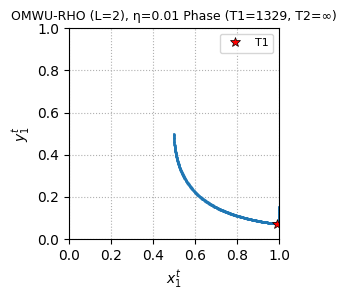

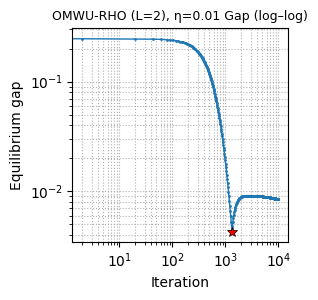

[OMWU-RHO] L=2, η=0.01  T1=1329  T2=∞  final_gap=0.0084332348244085


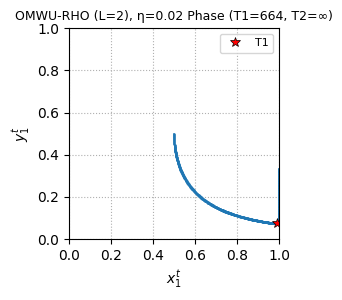

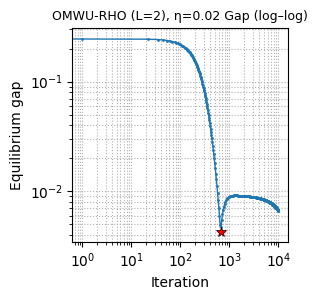

[OMWU-RHO] L=2, η=0.02  T1=664  T2=∞  final_gap=0.00662841372382883


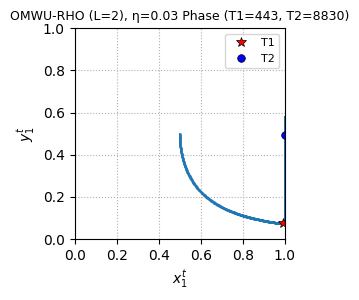

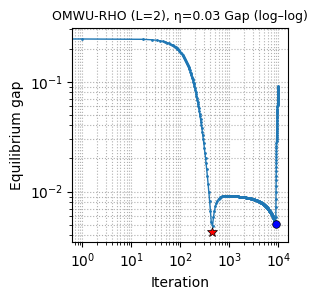

[OMWU-RHO] L=2, η=0.03  T1=443  T2=8830  final_gap=0.0920395743302558


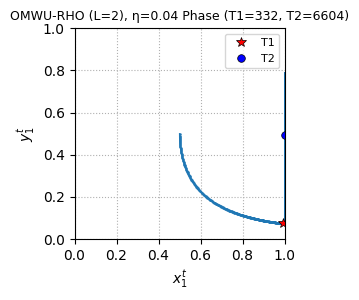

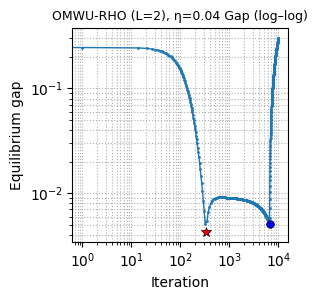

[OMWU-RHO] L=2, η=0.04  T1=332  T2=6604  final_gap=0.302199522640595


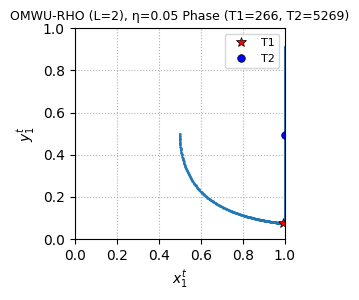

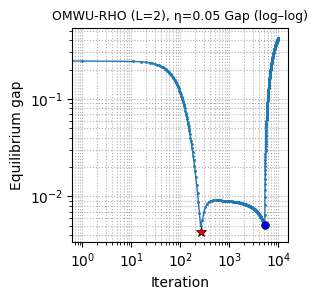

[OMWU-RHO] L=2, η=0.05  T1=266  T2=5269  final_gap=0.422509543438891


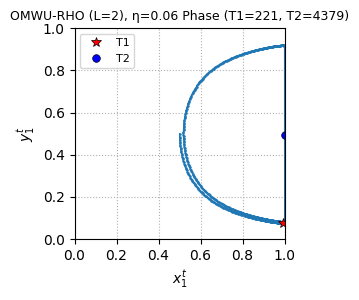

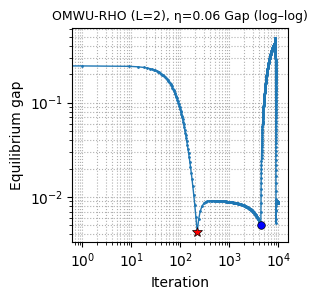

[OMWU-RHO] L=2, η=0.06  T1=221  T2=4379  final_gap=0.00857832462049646


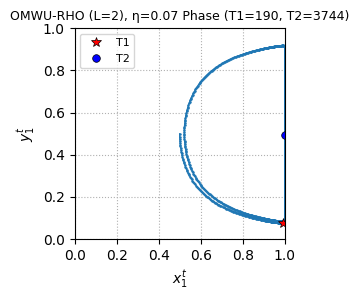

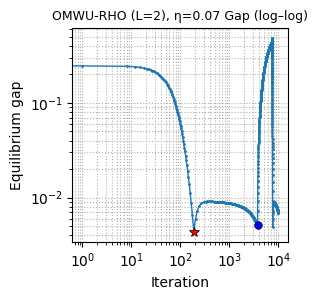

[OMWU-RHO] L=2, η=0.07  T1=190  T2=3744  final_gap=0.00682046734707231


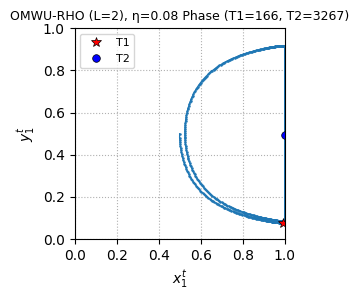

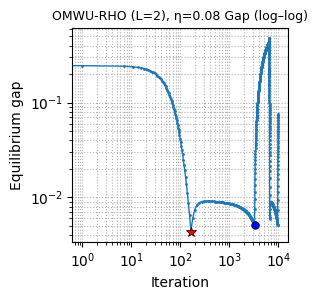

[OMWU-RHO] L=2, η=0.08  T1=166  T2=3267  final_gap=0.0772565688969667


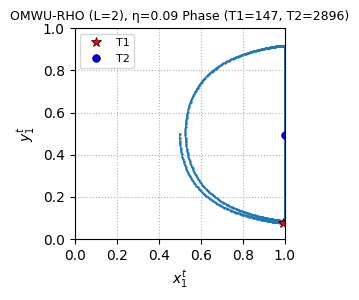

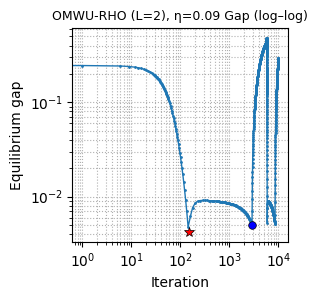

[OMWU-RHO] L=2, η=0.09  T1=147  T2=2896  final_gap=0.296538235325864


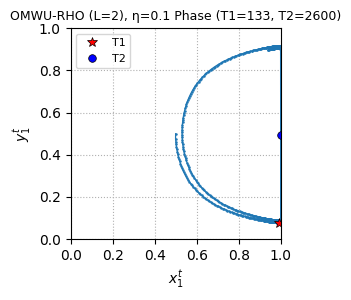

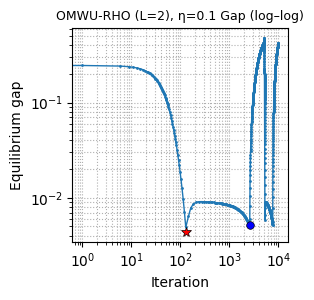

[OMWU-RHO] L=2, η=0.1  T1=133  T2=2600  final_gap=0.428574456956524


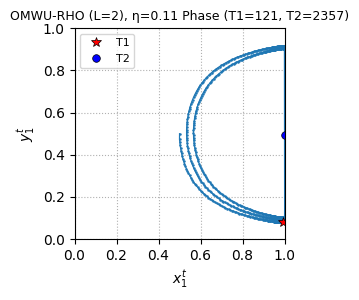

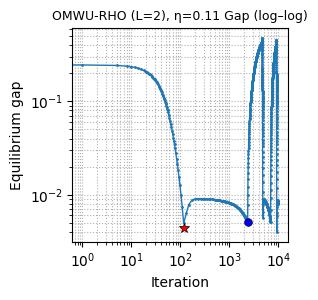

[OMWU-RHO] L=2, η=0.11  T1=121  T2=2357  final_gap=0.00796234006585106


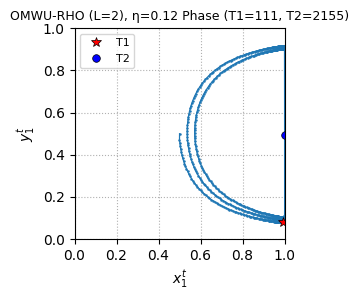

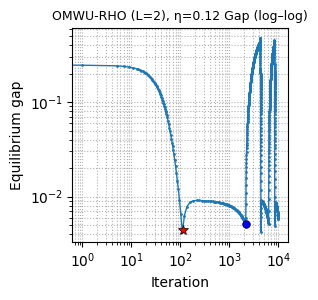

[OMWU-RHO] L=2, η=0.12  T1=111  T2=2155  final_gap=0.00570118254555718


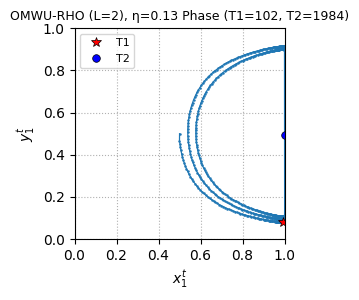

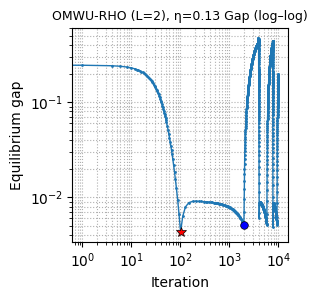

[OMWU-RHO] L=2, η=0.13  T1=102  T2=1984  final_gap=0.199358599910781


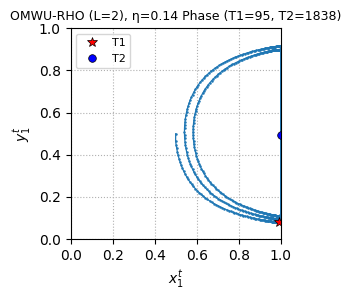

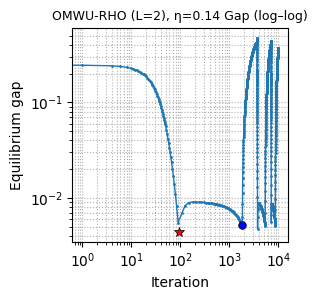

[OMWU-RHO] L=2, η=0.14  T1=95  T2=1838  final_gap=0.377080104140373


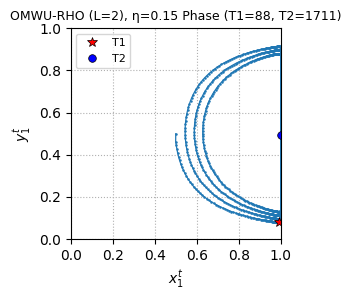

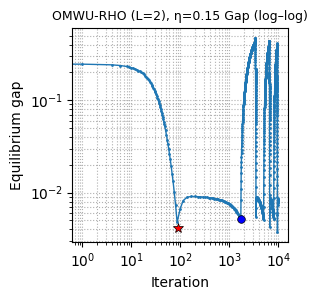

[OMWU-RHO] L=2, η=0.15  T1=88  T2=1711  final_gap=0.00779915522266306


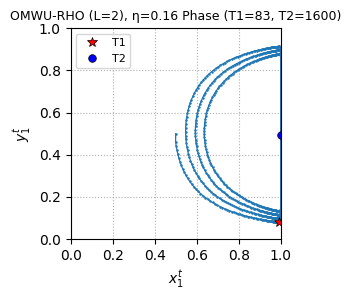

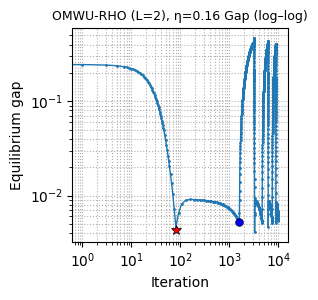

[OMWU-RHO] L=2, η=0.16  T1=83  T2=1600  final_gap=0.00532164804730972


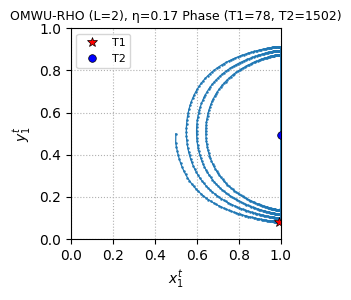

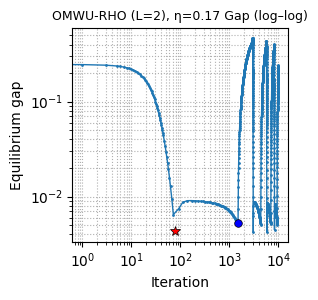

[OMWU-RHO] L=2, η=0.17  T1=78  T2=1502  final_gap=0.242045368668585


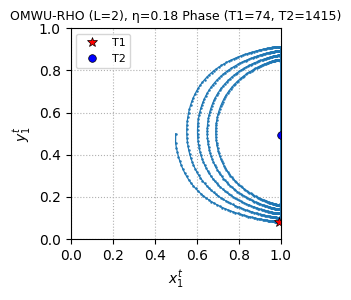

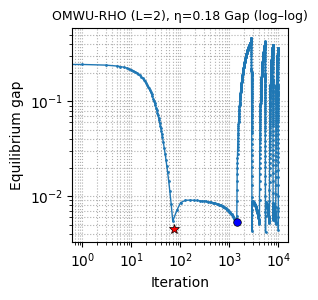

[OMWU-RHO] L=2, η=0.18  T1=74  T2=1415  final_gap=0.0080003576388028


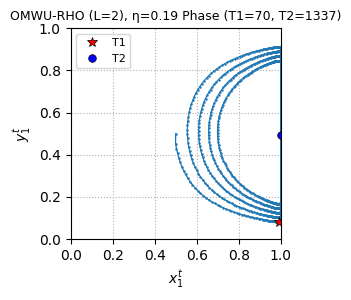

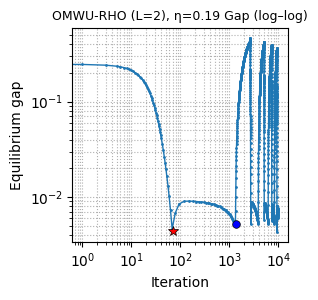

[OMWU-RHO] L=2, η=0.19  T1=70  T2=1337  final_gap=0.00596033744059277


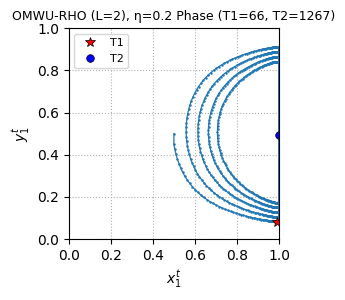

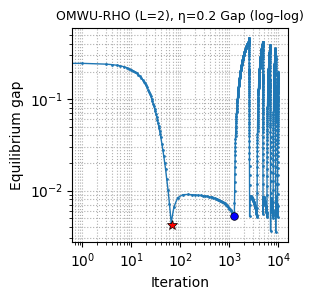

[OMWU-RHO] L=2, η=0.2  T1=66  T2=1267  final_gap=0.200145605797893


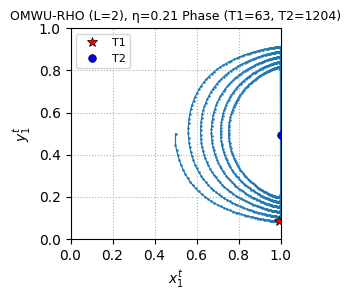

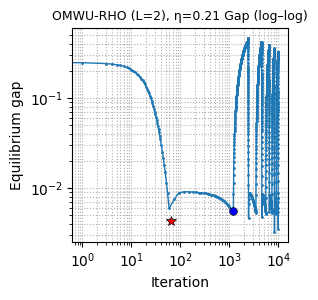

[OMWU-RHO] L=2, η=0.21  T1=63  T2=1204  final_gap=0.00773946811471427


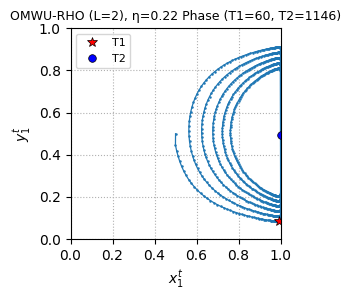

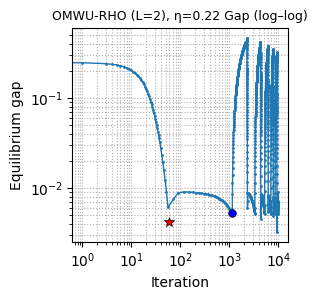

[OMWU-RHO] L=2, η=0.22  T1=60  T2=1146  final_gap=0.00903966839289227


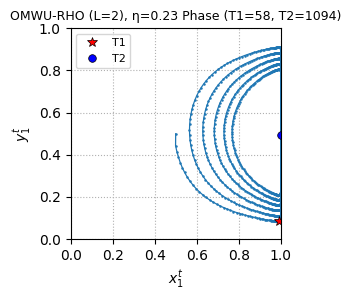

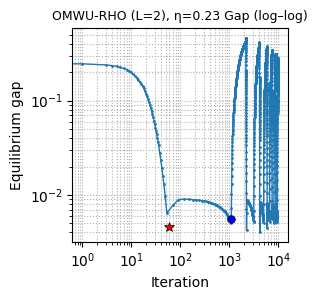

[OMWU-RHO] L=2, η=0.23  T1=58  T2=1094  final_gap=0.283309799189165


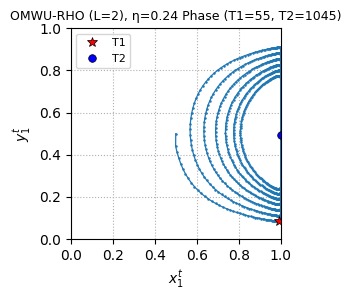

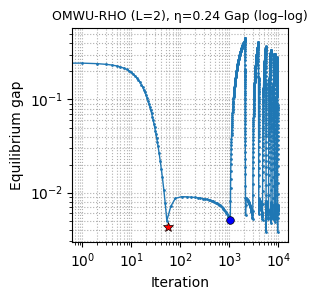

[OMWU-RHO] L=2, η=0.24  T1=55  T2=1045  final_gap=0.00581323243264331


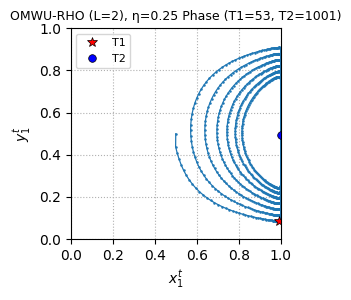

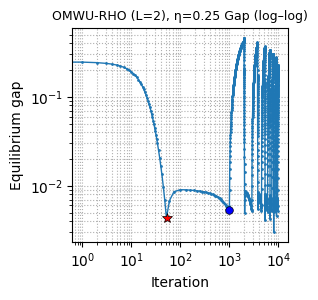

[OMWU-RHO] L=2, η=0.25  T1=53  T2=1001  final_gap=0.232092309115241


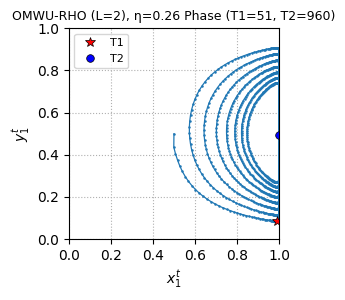

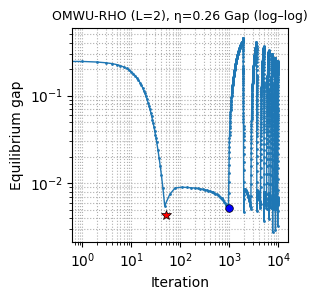

[OMWU-RHO] L=2, η=0.26  T1=51  T2=960  final_gap=0.00558768041505531


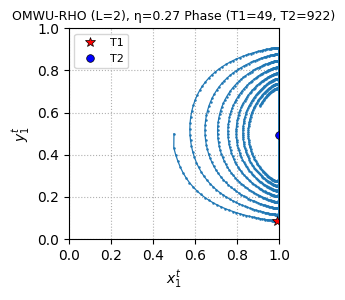

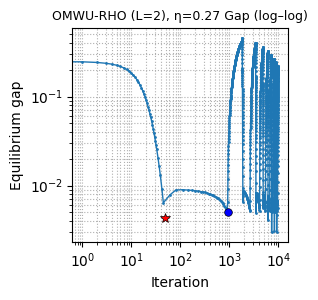

[OMWU-RHO] L=2, η=0.27  T1=49  T2=922  final_gap=0.178611579325525


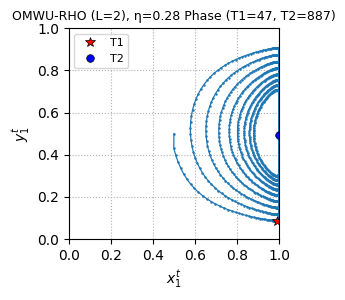

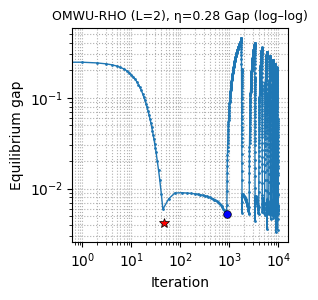

[OMWU-RHO] L=2, η=0.28  T1=47  T2=887  final_gap=0.060916978941486


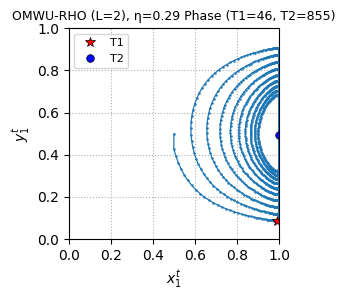

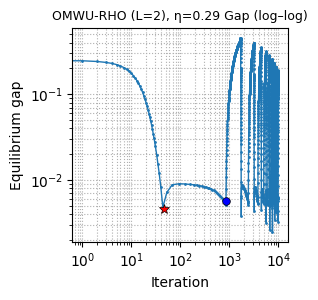

[OMWU-RHO] L=2, η=0.29  T1=46  T2=855  final_gap=0.00607221068875929


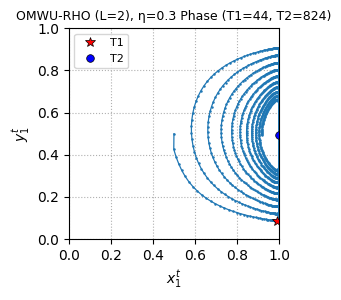

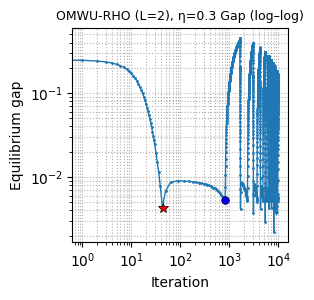

[OMWU-RHO] L=2, η=0.3  T1=44  T2=824  final_gap=0.0360967077982156


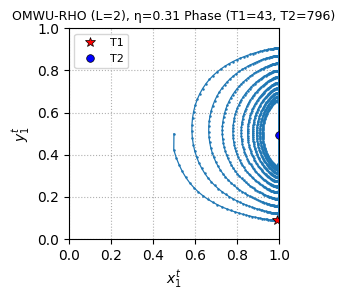

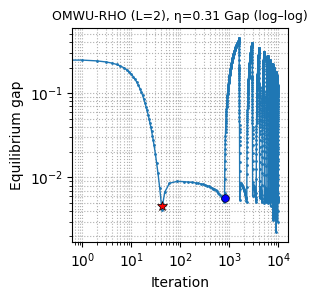

[OMWU-RHO] L=2, η=0.31  T1=43  T2=796  final_gap=0.126251299452851


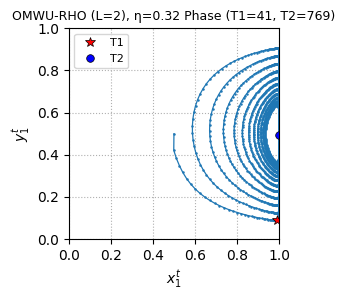

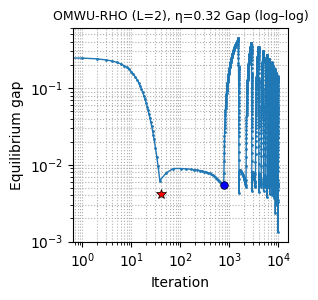

[OMWU-RHO] L=2, η=0.32  T1=41  T2=769  final_gap=0.0565615496291495


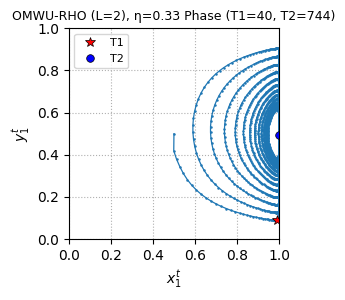

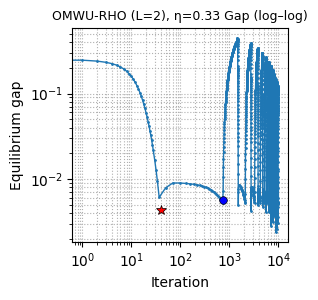

[OMWU-RHO] L=2, η=0.33  T1=40  T2=744  final_gap=0.0123469522599305


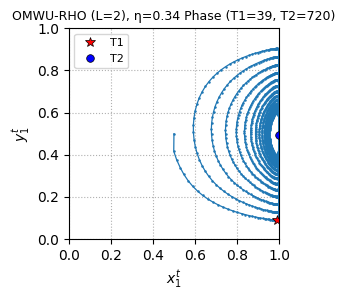

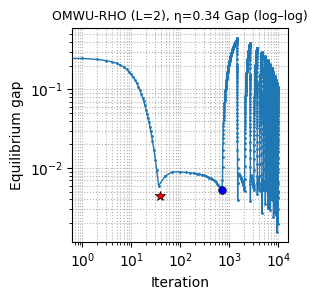

[OMWU-RHO] L=2, η=0.34  T1=39  T2=720  final_gap=0.00490680371213703


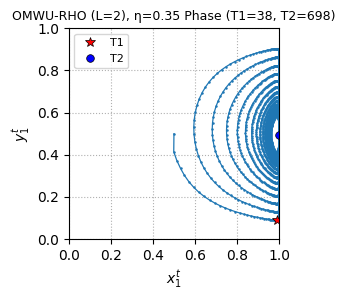

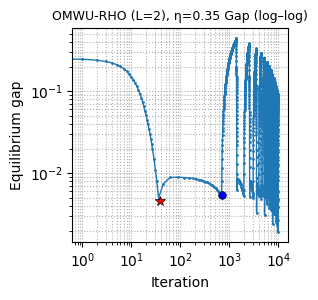

[OMWU-RHO] L=2, η=0.35  T1=38  T2=698  final_gap=0.0047349036177522


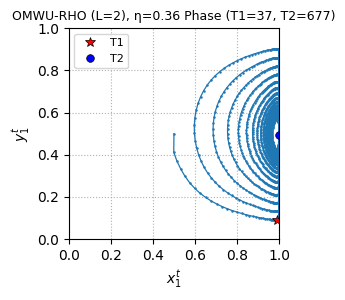

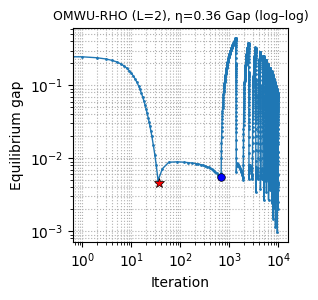

[OMWU-RHO] L=2, η=0.36  T1=37  T2=677  final_gap=0.00443372036083833


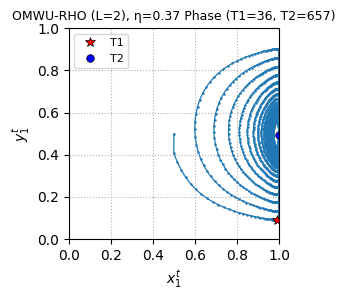

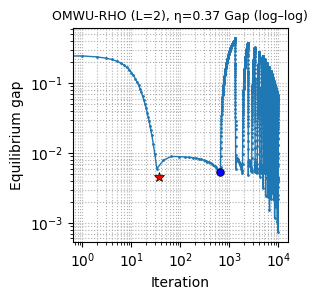

[OMWU-RHO] L=2, η=0.37  T1=36  T2=657  final_gap=0.00405350251877246


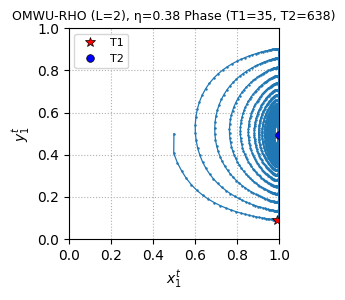

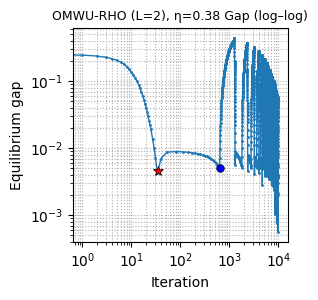

[OMWU-RHO] L=2, η=0.38  T1=35  T2=638  final_gap=0.0122803578586607


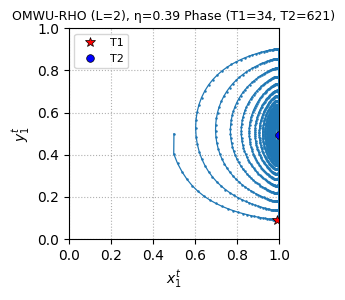

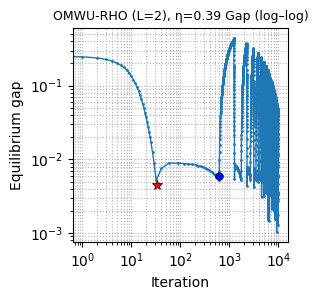

[OMWU-RHO] L=2, η=0.39  T1=34  T2=621  final_gap=0.0230417118142459


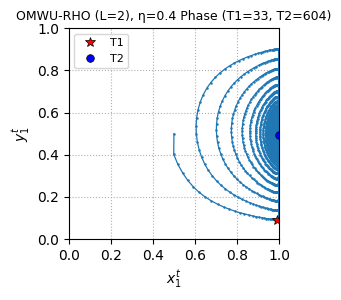

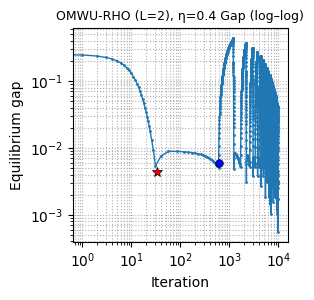

[OMWU-RHO] L=2, η=0.4  T1=33  T2=604  final_gap=0.0296099764039145


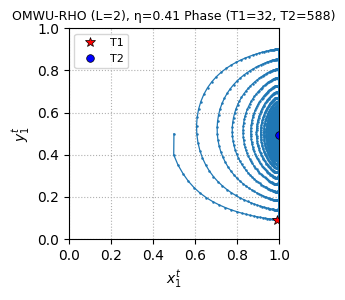

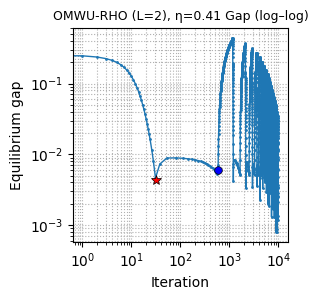

[OMWU-RHO] L=2, η=0.41  T1=32  T2=588  final_gap=0.0304368099394983


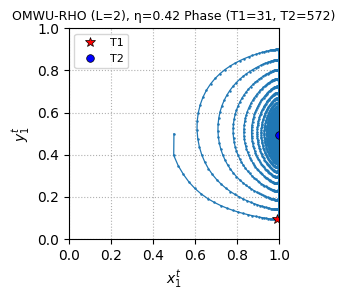

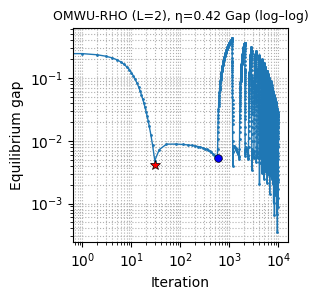

[OMWU-RHO] L=2, η=0.42  T1=31  T2=572  final_gap=0.0261609064832758


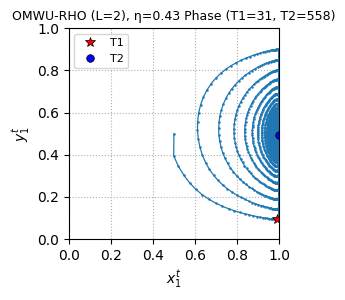

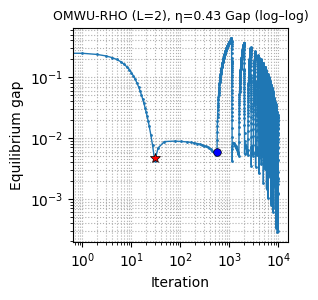

[OMWU-RHO] L=2, η=0.43  T1=31  T2=558  final_gap=0.0206140882692505


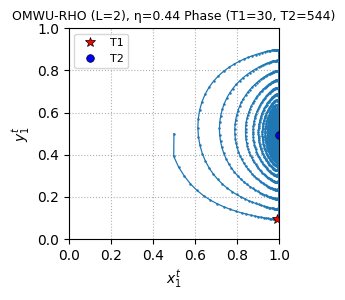

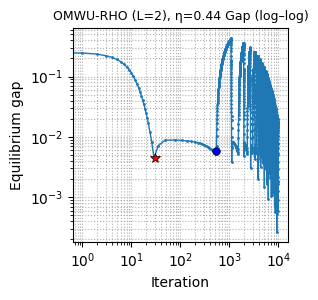

[OMWU-RHO] L=2, η=0.44  T1=30  T2=544  final_gap=0.0142208624043503


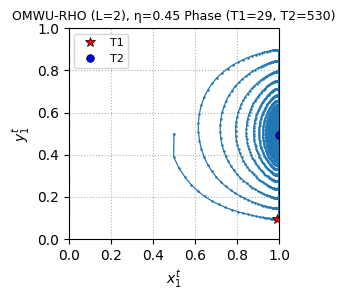

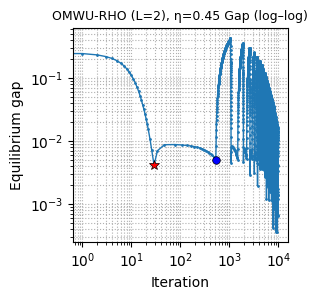

[OMWU-RHO] L=2, η=0.45  T1=29  T2=530  final_gap=0.00880530942960583


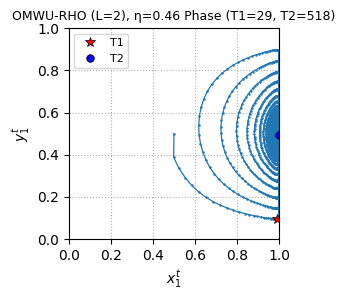

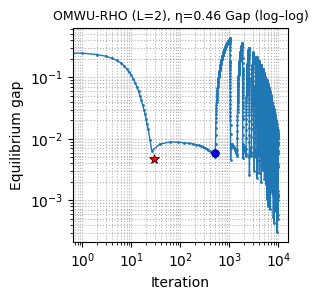

[OMWU-RHO] L=2, η=0.46  T1=29  T2=518  final_gap=0.00501319921817478


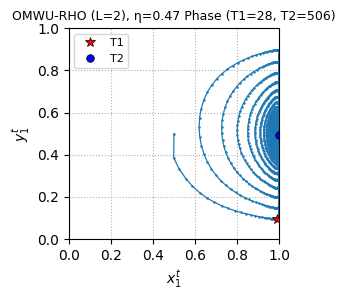

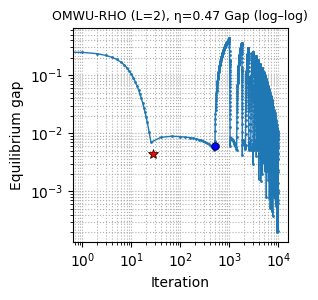

[OMWU-RHO] L=2, η=0.47  T1=28  T2=506  final_gap=0.00271305134853217


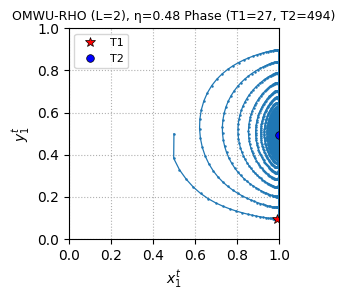

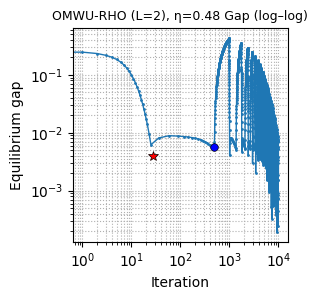

[OMWU-RHO] L=2, η=0.48  T1=27  T2=494  final_gap=0.00150146614631086


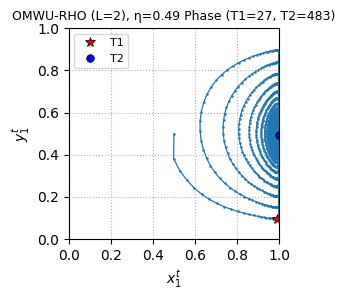

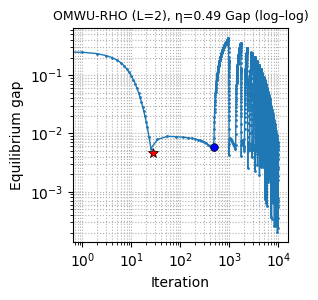

[OMWU-RHO] L=2, η=0.49  T1=27  T2=483  final_gap=0.000982317266658539


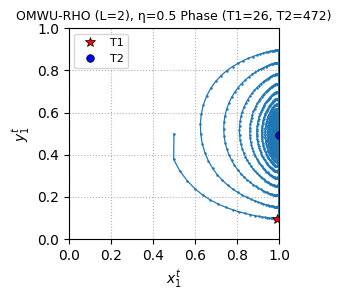

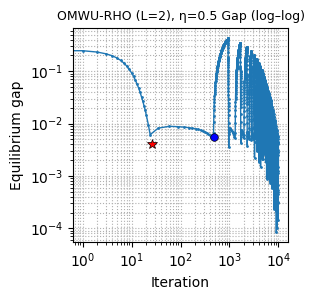

[OMWU-RHO] L=2, η=0.5  T1=26  T2=472  final_gap=0.000855763584370894


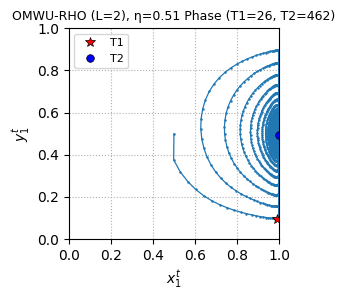

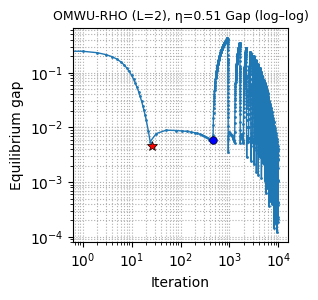

[OMWU-RHO] L=2, η=0.51  T1=26  T2=462  final_gap=0.000919408461542814


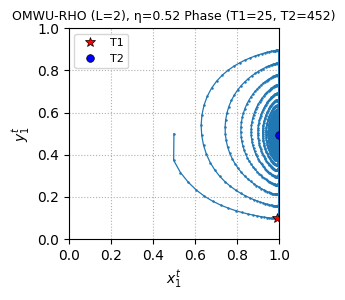

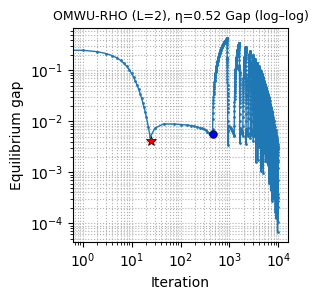

[OMWU-RHO] L=2, η=0.52  T1=25  T2=452  final_gap=0.00104449512777538


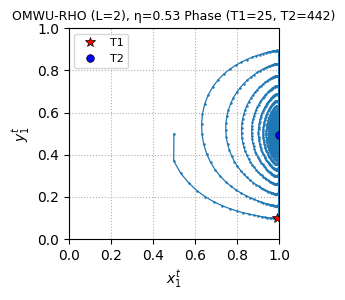

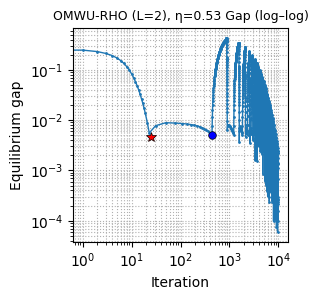

[OMWU-RHO] L=2, η=0.53  T1=25  T2=442  final_gap=0.00115262506521341


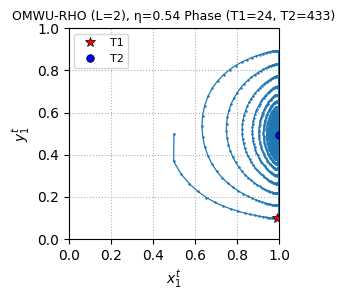

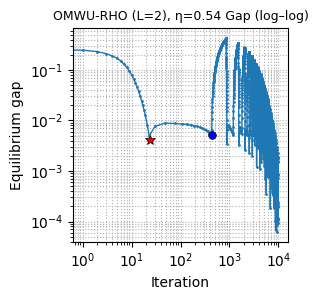

[OMWU-RHO] L=2, η=0.54  T1=24  T2=433  final_gap=0.00119962043477706


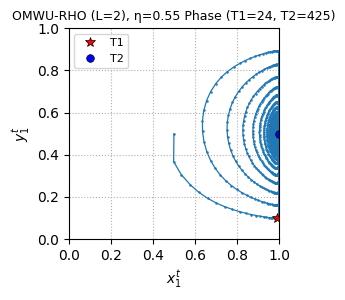

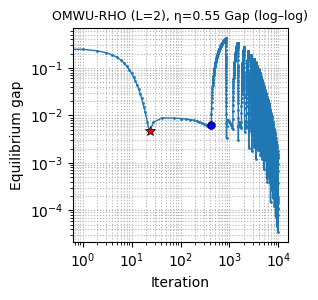

[OMWU-RHO] L=2, η=0.55  T1=24  T2=425  final_gap=0.00116594593410579


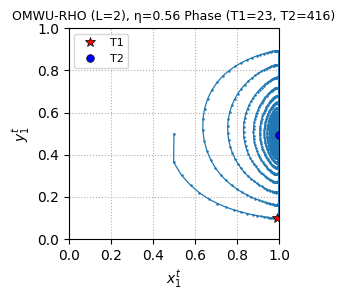

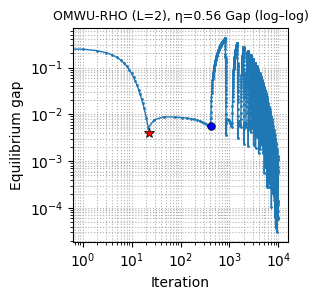

[OMWU-RHO] L=2, η=0.56  T1=23  T2=416  final_gap=0.00105114465561573


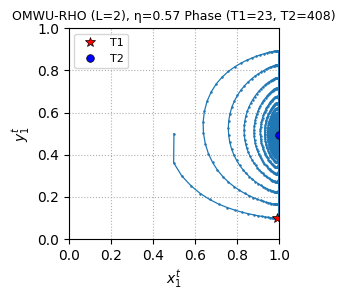

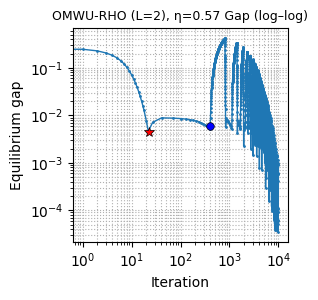

[OMWU-RHO] L=2, η=0.57  T1=23  T2=408  final_gap=0.000869803997813556


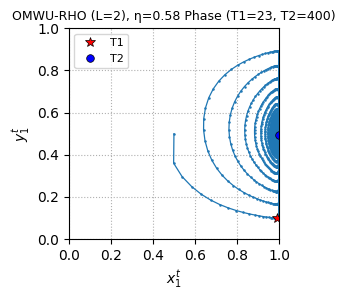

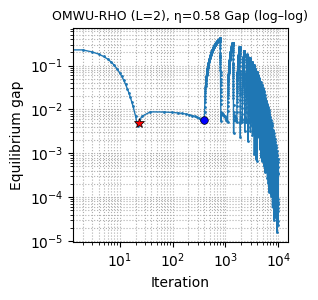

[OMWU-RHO] L=2, η=0.58  T1=23  T2=400  final_gap=0.000668887959430875


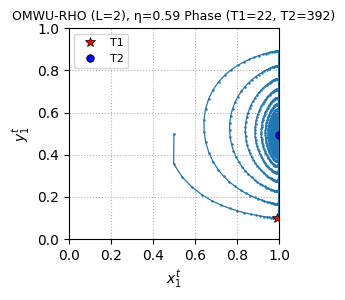

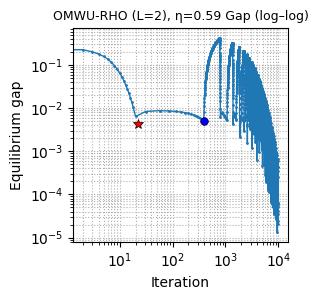

[OMWU-RHO] L=2, η=0.59  T1=22  T2=392  final_gap=0.000466140178313479


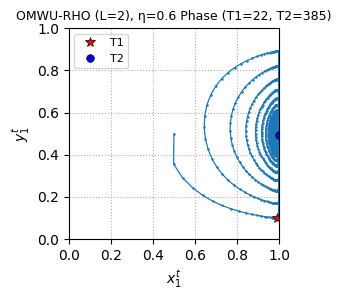

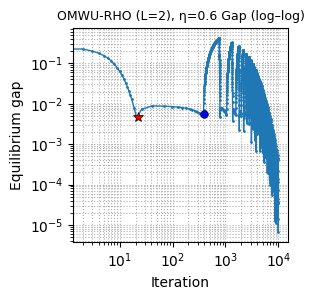

[OMWU-RHO] L=2, η=0.6  T1=22  T2=385  final_gap=0.000264677218250742


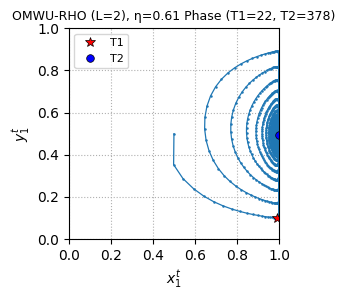

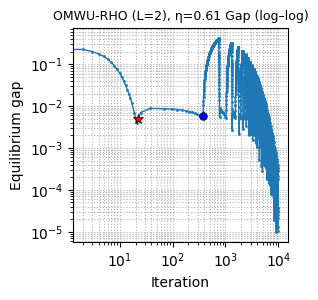

[OMWU-RHO] L=2, η=0.61  T1=22  T2=378  final_gap=9.31216472078722e-5


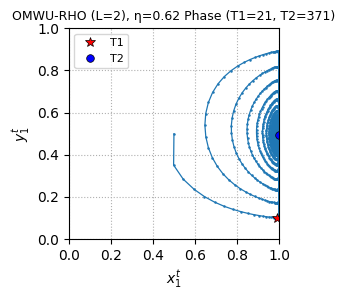

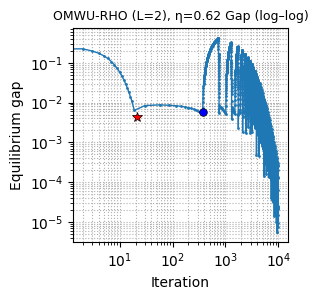

[OMWU-RHO] L=2, η=0.62  T1=21  T2=371  final_gap=2.22762756495465e-5


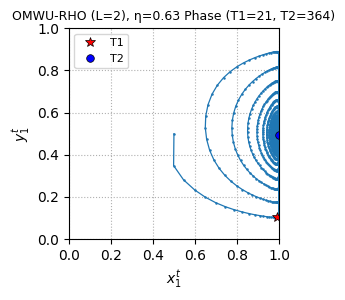

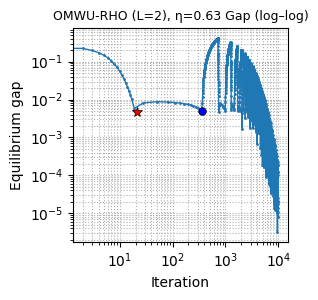

[OMWU-RHO] L=2, η=0.63  T1=21  T2=364  final_gap=1.38135642306914e-5


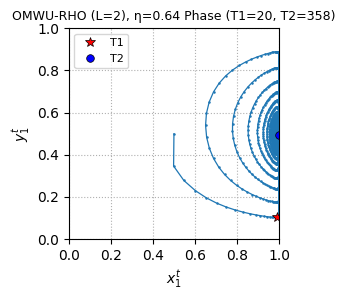

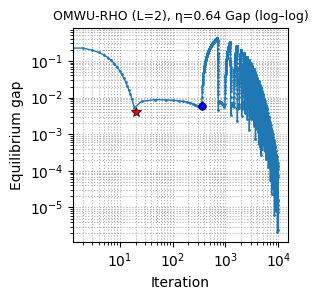

[OMWU-RHO] L=2, η=0.64  T1=20  T2=358  final_gap=5.54094639526603e-6


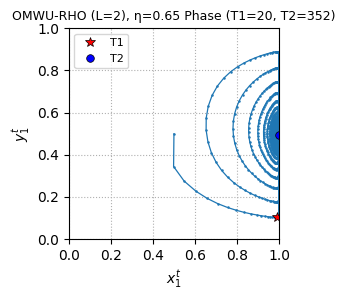

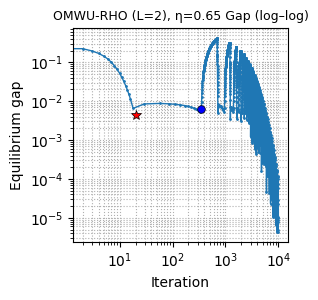

[OMWU-RHO] L=2, η=0.65  T1=20  T2=352  final_gap=2.47757781324243e-6


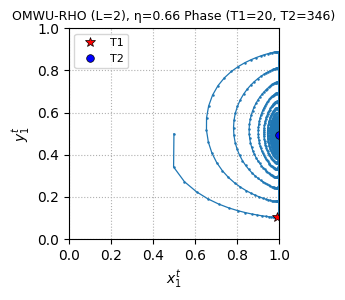

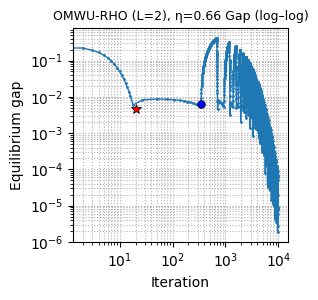

[OMWU-RHO] L=2, η=0.66  T1=20  T2=346  final_gap=4.99724525704348e-6


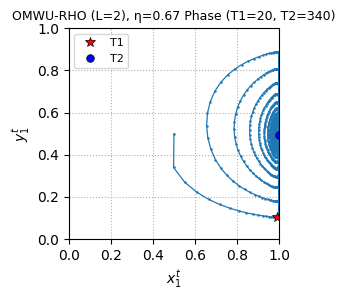

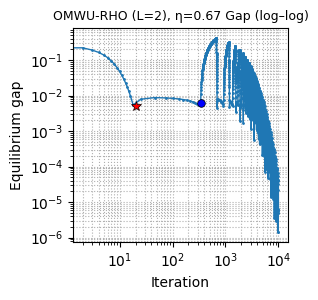

[OMWU-RHO] L=2, η=0.67  T1=20  T2=340  final_gap=4.94837930453684e-6


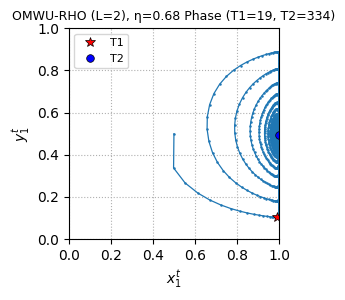

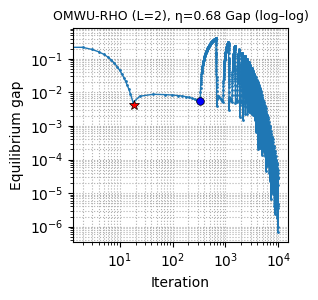

[OMWU-RHO] L=2, η=0.68  T1=19  T2=334  final_gap=1.49030309625209e-5


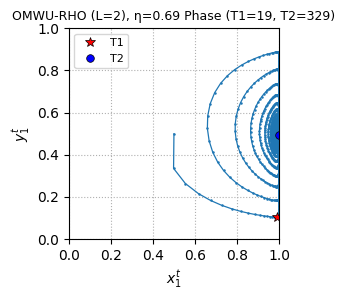

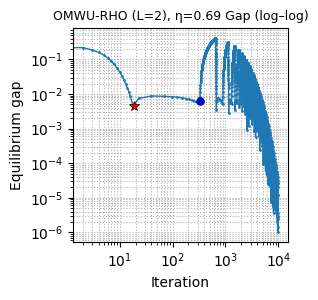

[OMWU-RHO] L=2, η=0.69  T1=19  T2=329  final_gap=2.31997088938618e-5


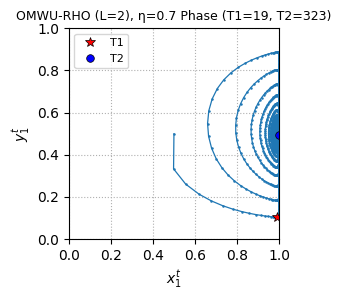

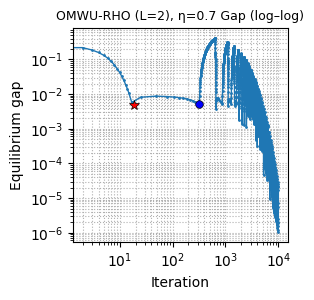

[OMWU-RHO] L=2, η=0.7  T1=19  T2=323  final_gap=1.9690439805653e-5


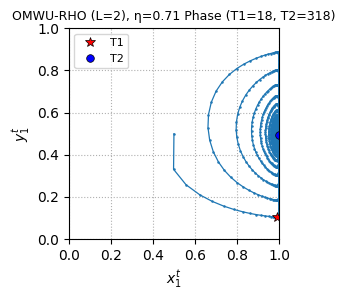

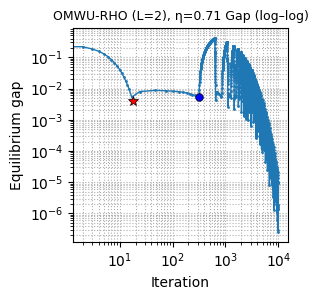

[OMWU-RHO] L=2, η=0.71  T1=18  T2=318  final_gap=1.23403752053663e-5


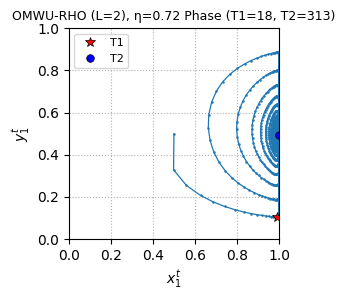

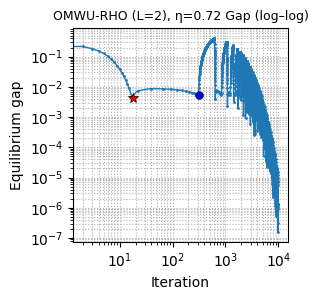

[OMWU-RHO] L=2, η=0.72  T1=18  T2=313  final_gap=3.79451540055697e-6


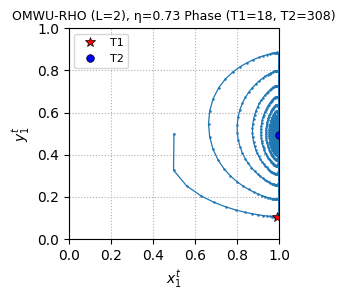

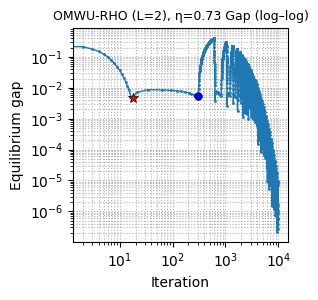

[OMWU-RHO] L=2, η=0.73  T1=18  T2=308  final_gap=7.10462294328806e-7


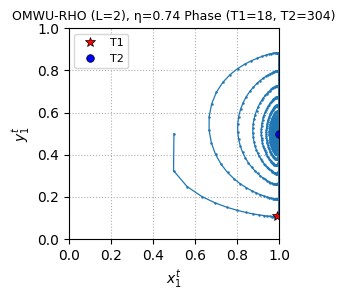

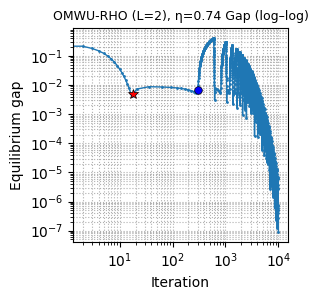

[OMWU-RHO] L=2, η=0.74  T1=18  T2=304  final_gap=2.86485308809148e-7


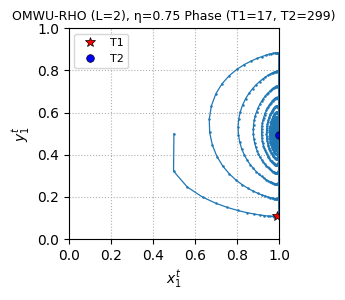

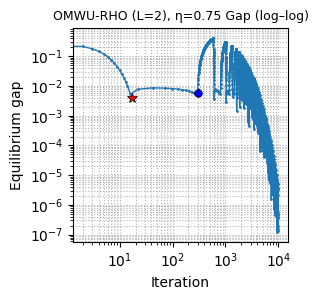

[OMWU-RHO] L=2, η=0.75  T1=17  T2=299  final_gap=1.23877853419607e-7


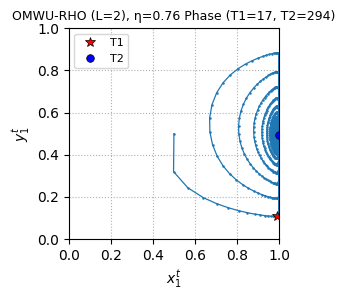

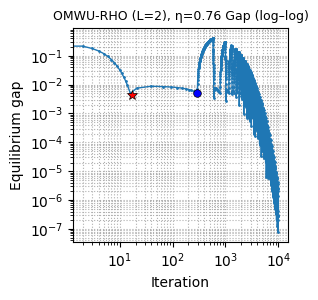

[OMWU-RHO] L=2, η=0.76  T1=17  T2=294  final_gap=2.29063308654354e-7


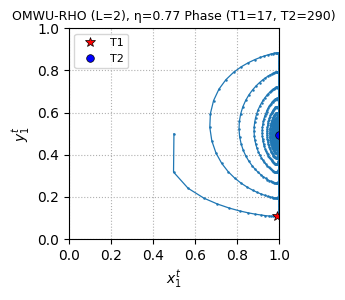

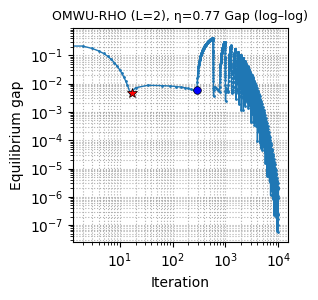

[OMWU-RHO] L=2, η=0.77  T1=17  T2=290  final_gap=4.31436404824126e-7


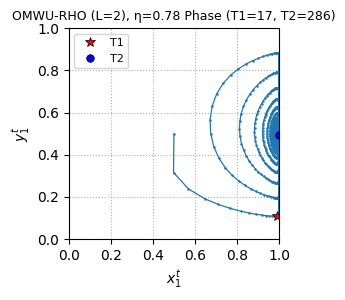

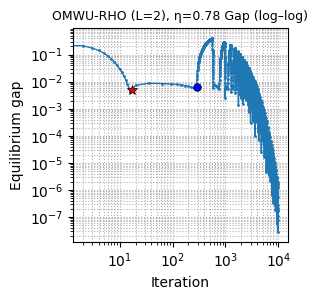

[OMWU-RHO] L=2, η=0.78  T1=17  T2=286  final_gap=1.08573296209169e-6


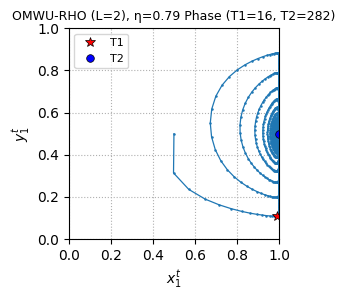

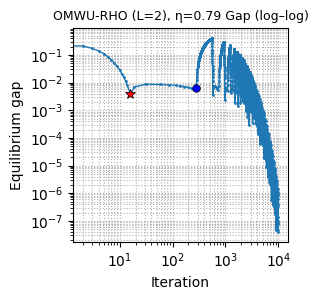

[OMWU-RHO] L=2, η=0.79  T1=16  T2=282  final_gap=9.06655483468022e-7


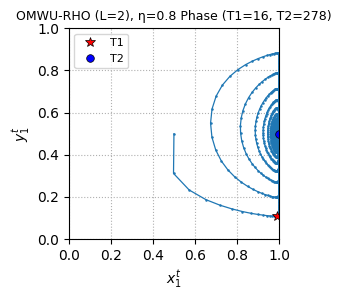

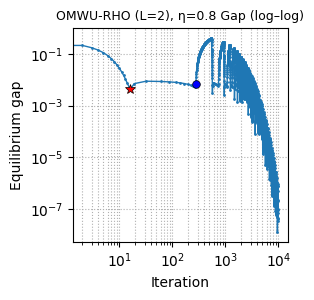

[OMWU-RHO] L=2, η=0.8  T1=16  T2=278  final_gap=4.5521685898553e-7


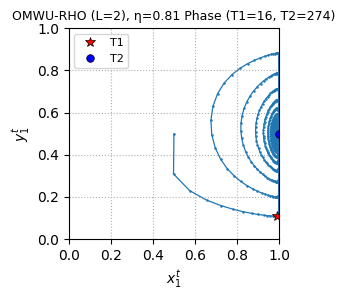

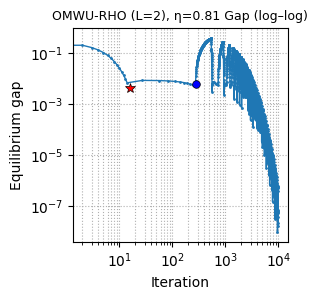

[OMWU-RHO] L=2, η=0.81  T1=16  T2=274  final_gap=4.38530368684908e-8


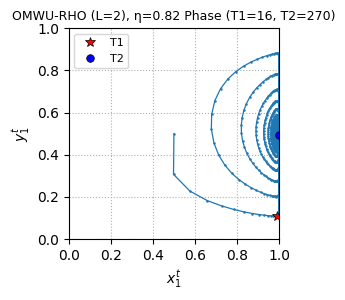

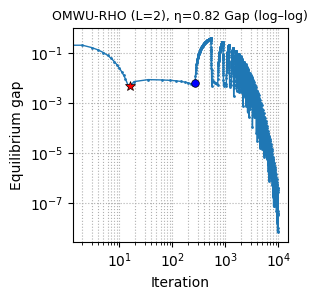

[OMWU-RHO] L=2, η=0.82  T1=16  T2=270  final_gap=2.1329092159128e-8


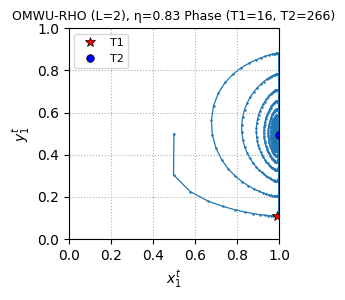

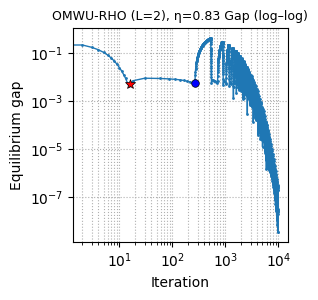

[OMWU-RHO] L=2, η=0.83  T1=16  T2=266  final_gap=4.52934134642646e-9


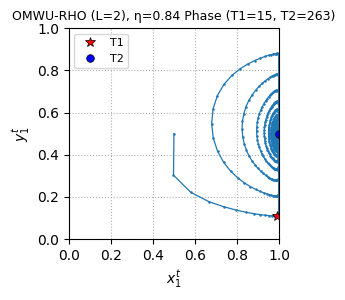

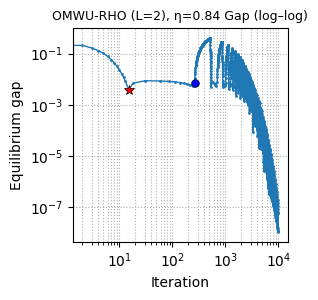

[OMWU-RHO] L=2, η=0.84  T1=15  T2=263  final_gap=1.19365254347414e-8


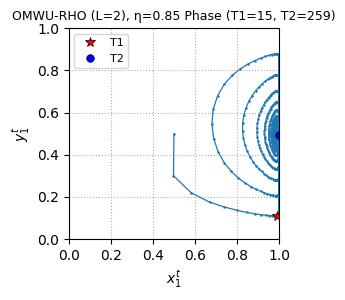

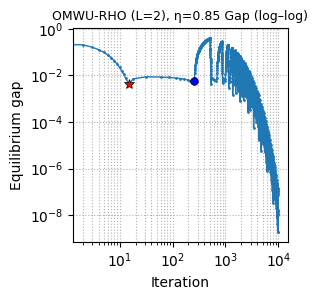

[OMWU-RHO] L=2, η=0.85  T1=15  T2=259  final_gap=2.87312263980155e-8


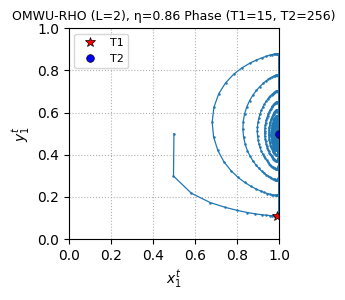

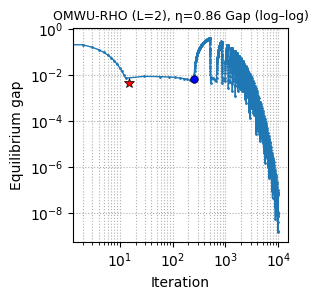

[OMWU-RHO] L=2, η=0.86  T1=15  T2=256  final_gap=5.80895390678293e-8


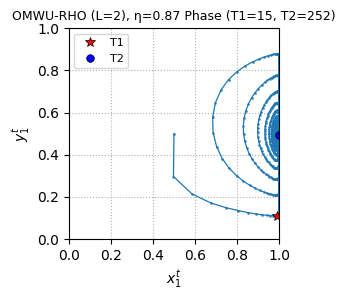

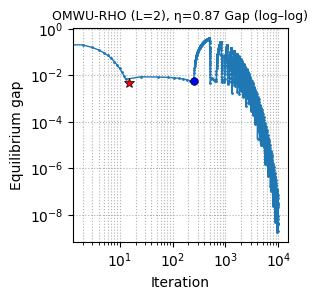

[OMWU-RHO] L=2, η=0.87  T1=15  T2=252  final_gap=4.14923716496318e-8


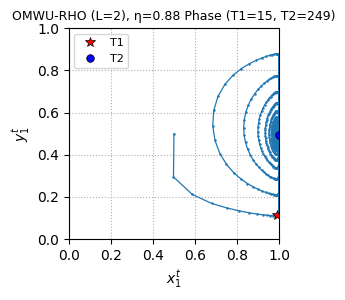

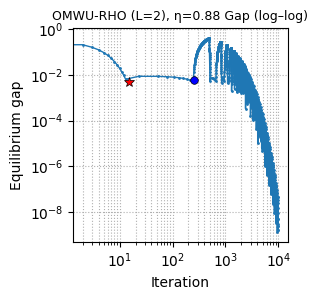

[OMWU-RHO] L=2, η=0.88  T1=15  T2=249  final_gap=1.29870144638389e-8


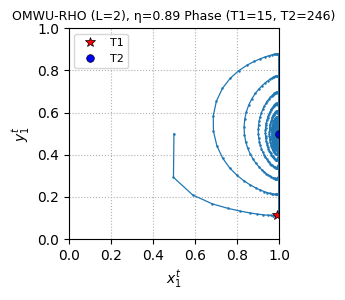

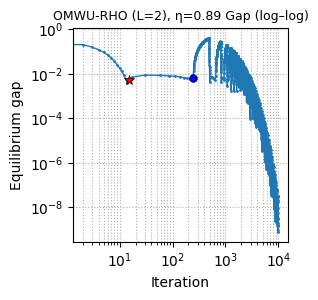

[OMWU-RHO] L=2, η=0.89  T1=15  T2=246  final_gap=1.76404724161472e-9


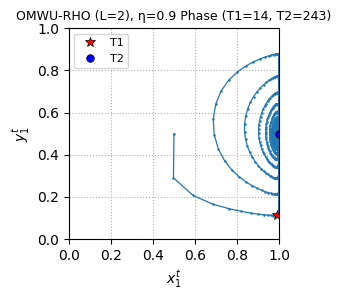

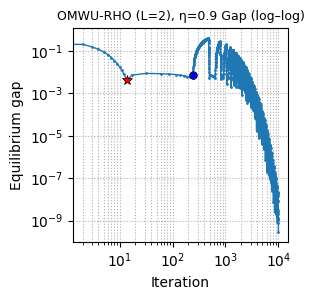

[OMWU-RHO] L=2, η=0.9  T1=14  T2=243  final_gap=3.64206997893746e-10


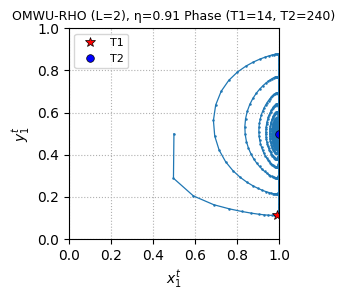

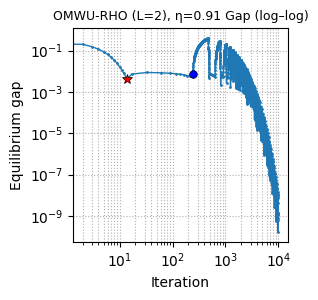

[OMWU-RHO] L=2, η=0.91  T1=14  T2=240  final_gap=5.8519722401229e-10


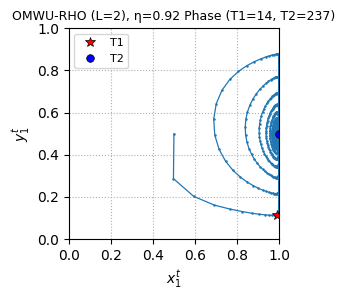

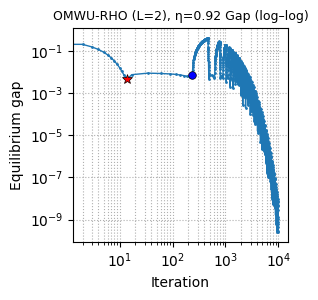

[OMWU-RHO] L=2, η=0.92  T1=14  T2=237  final_gap=6.41897979214434e-10


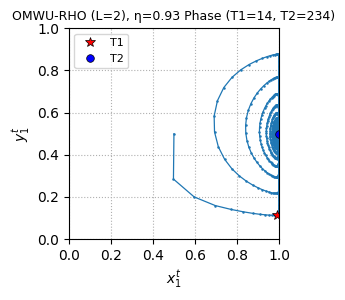

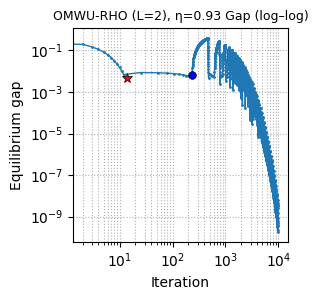

[OMWU-RHO] L=2, η=0.93  T1=14  T2=234  final_gap=3.02107960870046e-9


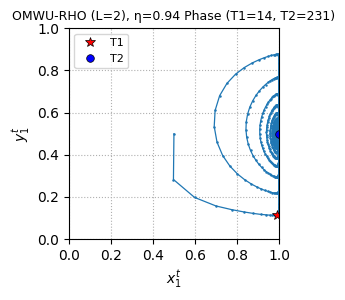

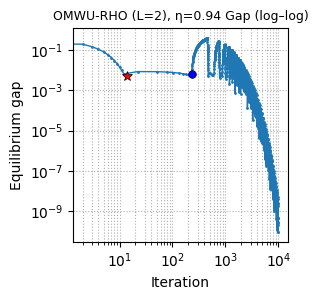

[OMWU-RHO] L=2, η=0.94  T1=14  T2=231  final_gap=2.27064667068788e-9


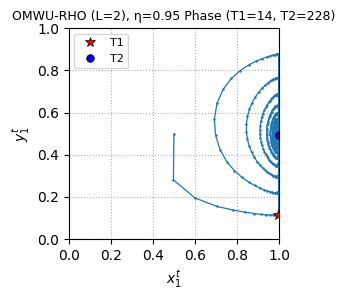

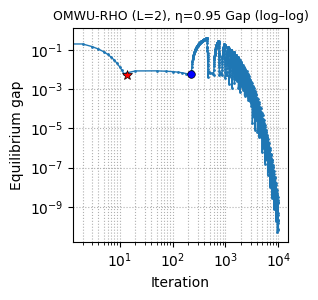

[OMWU-RHO] L=2, η=0.95  T1=14  T2=228  final_gap=7.00306368450754e-10


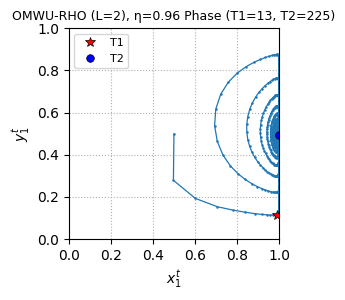

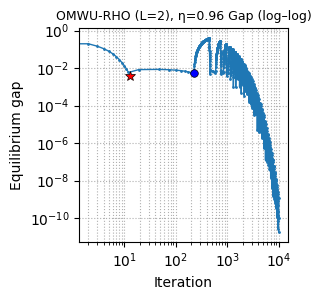

[OMWU-RHO] L=2, η=0.96  T1=13  T2=225  final_gap=8.76099193192204e-11


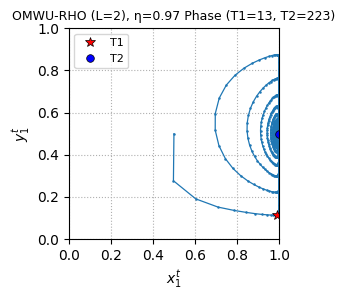

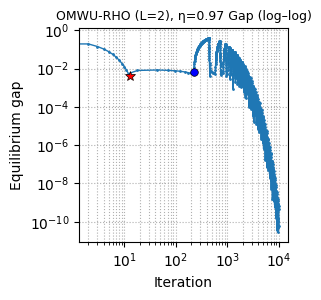

[OMWU-RHO] L=2, η=0.97  T1=13  T2=223  final_gap=1.24297239167959e-11


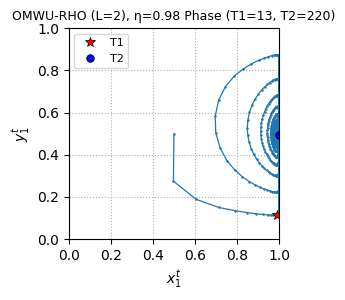

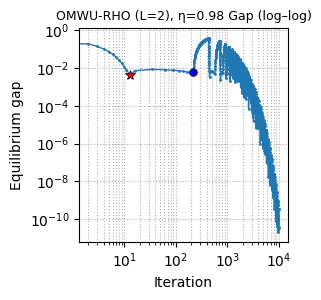

[OMWU-RHO] L=2, η=0.98  T1=13  T2=220  final_gap=3.11707326616784e-11


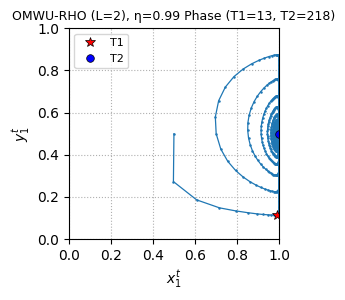

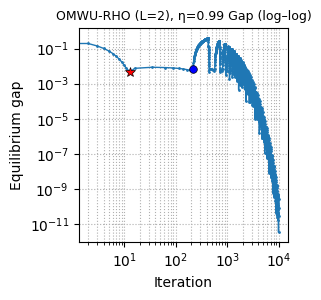

[OMWU-RHO] L=2, η=0.99  T1=13  T2=218  final_gap=7.51022577460958e-11


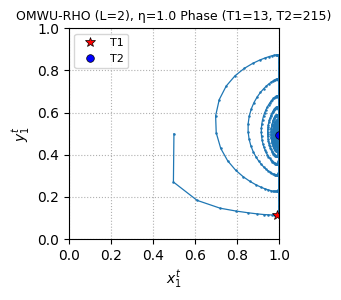

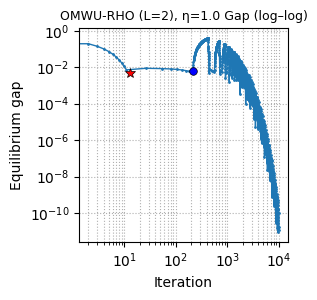

[OMWU-RHO] L=2, η=1.0  T1=13  T2=215  final_gap=1.49109946612214e-10


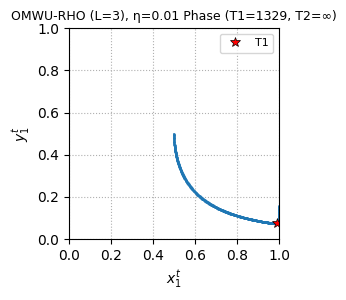

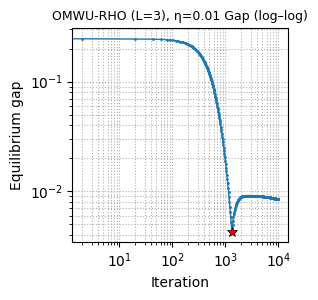

[OMWU-RHO] L=3, η=0.01  T1=1329  T2=∞  final_gap=0.00842950909873286


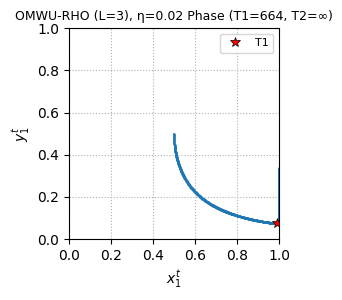

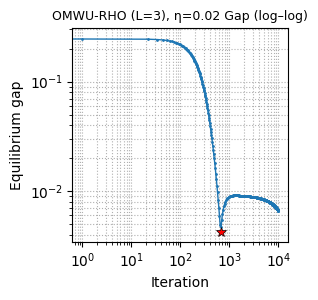

[OMWU-RHO] L=3, η=0.02  T1=664  T2=∞  final_gap=0.00661587183271184


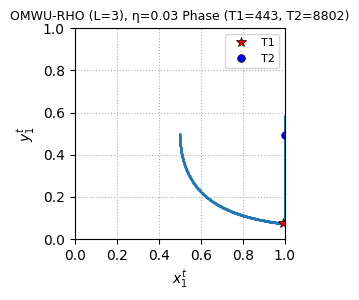

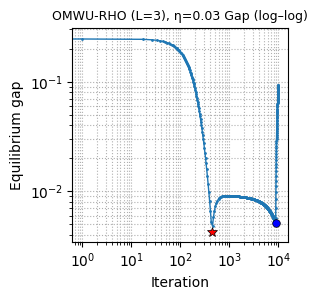

[OMWU-RHO] L=3, η=0.03  T1=443  T2=8802  final_gap=0.0940743933349767


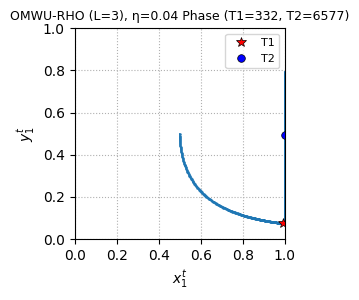

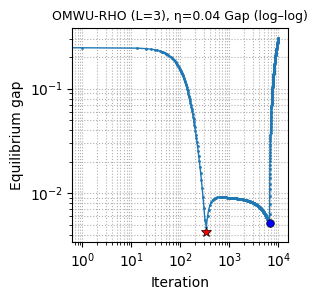

[OMWU-RHO] L=3, η=0.04  T1=332  T2=6577  final_gap=0.304022132685028


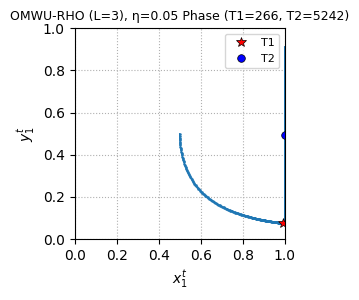

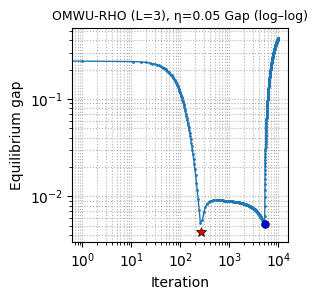

[OMWU-RHO] L=3, η=0.05  T1=266  T2=5242  final_gap=0.423497285167001


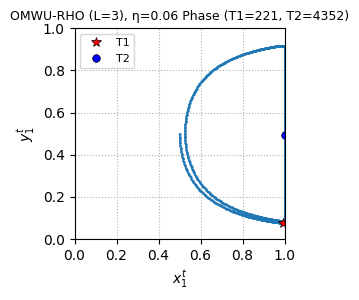

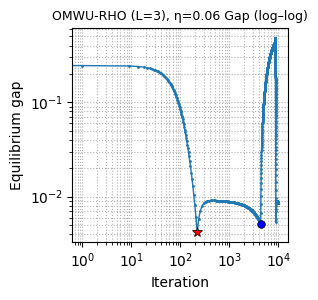

[OMWU-RHO] L=3, η=0.06  T1=221  T2=4352  final_gap=0.00847727714295554


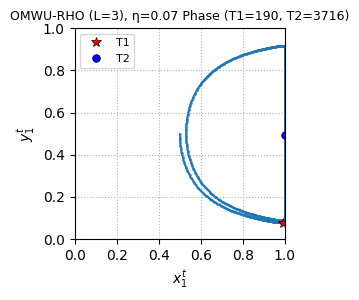

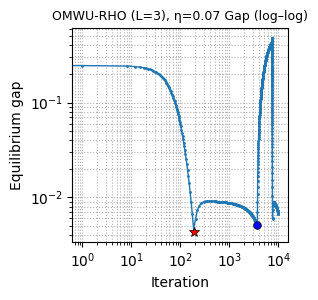

[OMWU-RHO] L=3, η=0.07  T1=190  T2=3716  final_gap=0.00661546459634232


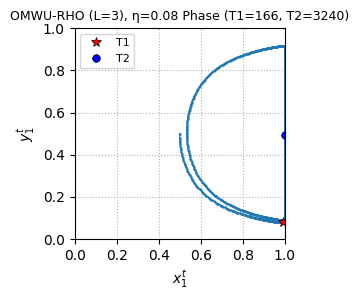

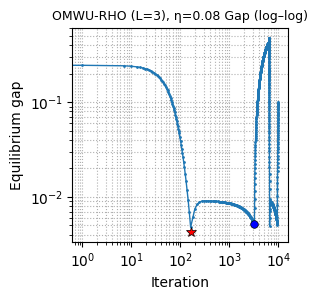

[OMWU-RHO] L=3, η=0.08  T1=166  T2=3240  final_gap=0.102884976001184


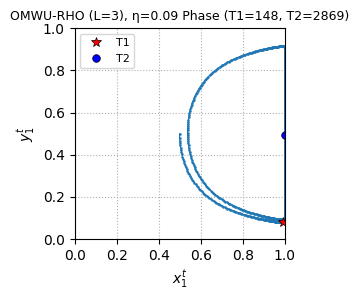

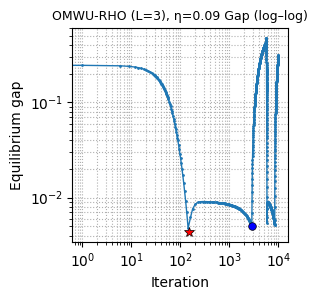

[OMWU-RHO] L=3, η=0.09  T1=148  T2=2869  final_gap=0.31556027106608


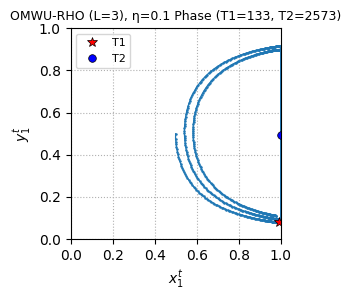

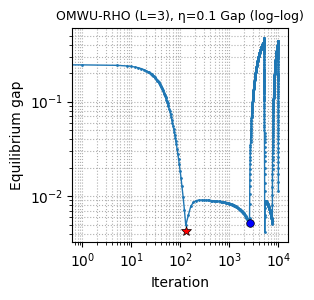

[OMWU-RHO] L=3, η=0.1  T1=133  T2=2573  final_gap=0.00921189330451344


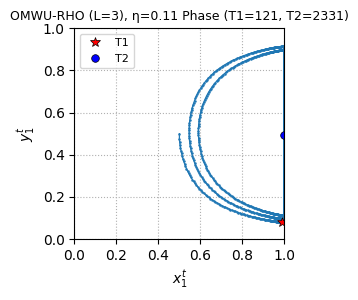

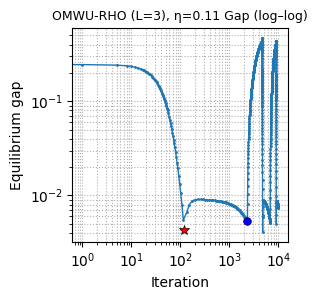

[OMWU-RHO] L=3, η=0.11  T1=121  T2=2331  final_gap=0.00734983592866612


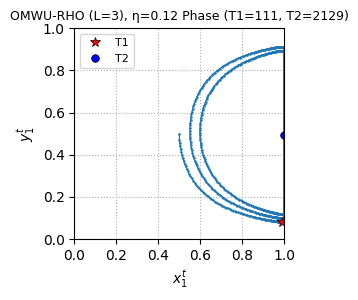

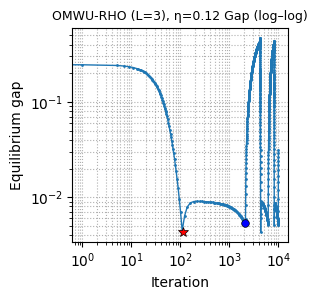

[OMWU-RHO] L=3, η=0.12  T1=111  T2=2129  final_gap=0.0314877662747918


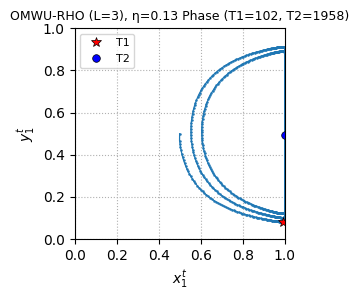

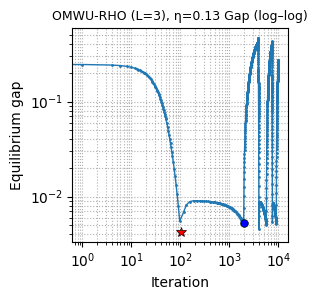

[OMWU-RHO] L=3, η=0.13  T1=102  T2=1958  final_gap=0.276761144725208


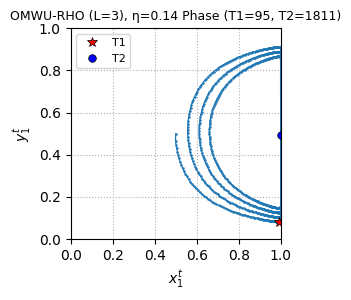

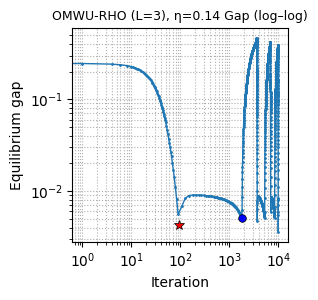

[OMWU-RHO] L=3, η=0.14  T1=95  T2=1811  final_gap=0.00829662246961749


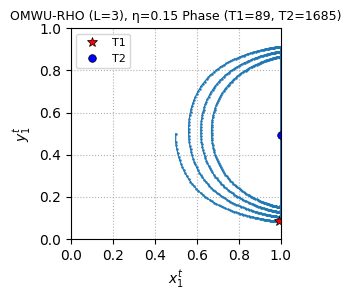

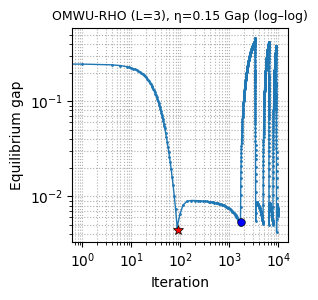

[OMWU-RHO] L=3, η=0.15  T1=89  T2=1685  final_gap=0.00620250703721348


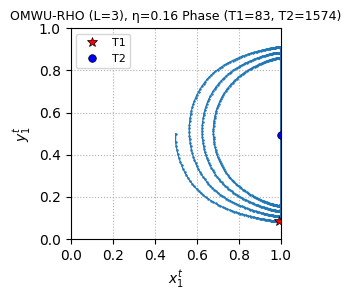

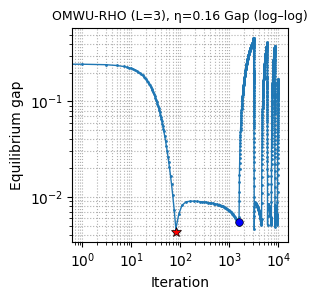

[OMWU-RHO] L=3, η=0.16  T1=83  T2=1574  final_gap=0.173869063689746


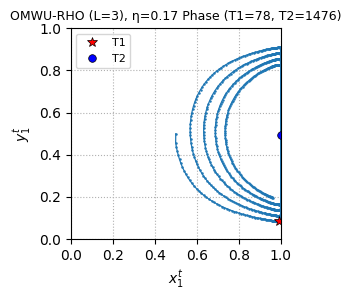

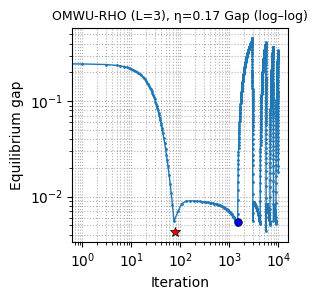

[OMWU-RHO] L=3, η=0.17  T1=78  T2=1476  final_gap=0.016989550495029


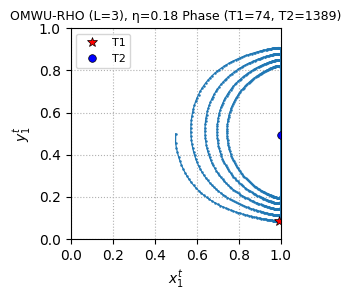

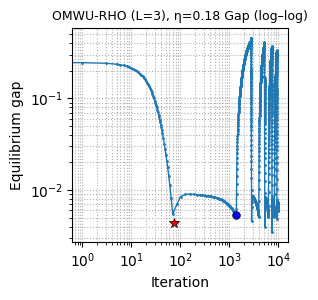

[OMWU-RHO] L=3, η=0.18  T1=74  T2=1389  final_gap=0.00571933781819178


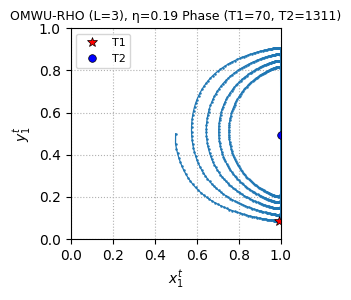

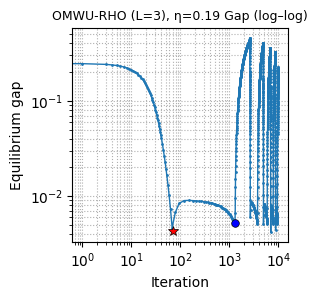

[OMWU-RHO] L=3, η=0.19  T1=70  T2=1311  final_gap=0.229572985041269


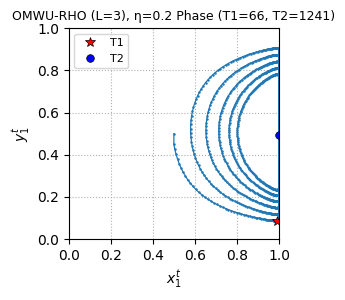

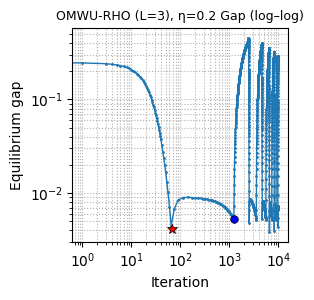

[OMWU-RHO] L=3, η=0.2  T1=66  T2=1241  final_gap=0.00663203918044752


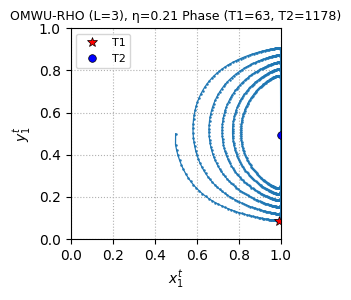

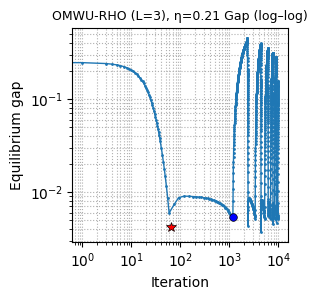

[OMWU-RHO] L=3, η=0.21  T1=63  T2=1178  final_gap=0.157946500701721


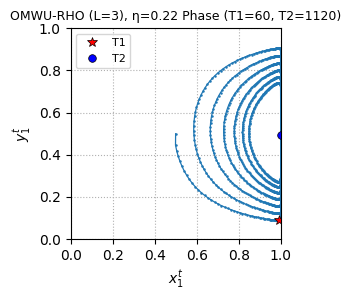

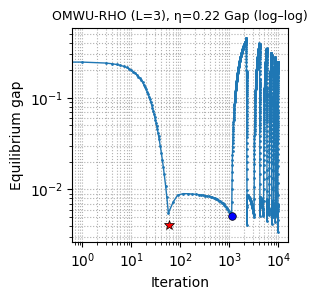

[OMWU-RHO] L=3, η=0.22  T1=60  T2=1120  final_gap=0.00638359268319255


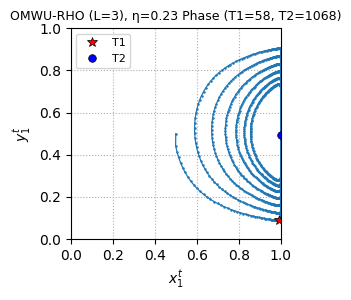

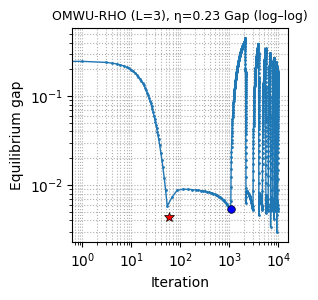

[OMWU-RHO] L=3, η=0.23  T1=58  T2=1068  final_gap=0.191273577178758


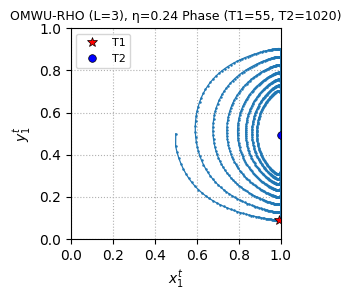

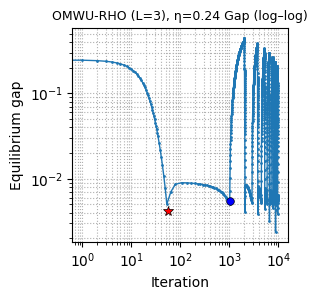

[OMWU-RHO] L=3, η=0.24  T1=55  T2=1020  final_gap=0.00514126817529037


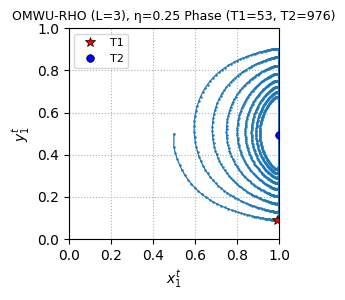

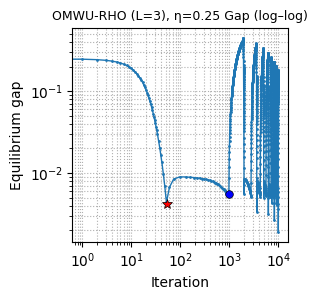

[OMWU-RHO] L=3, η=0.25  T1=53  T2=976  final_gap=0.00589236654339154


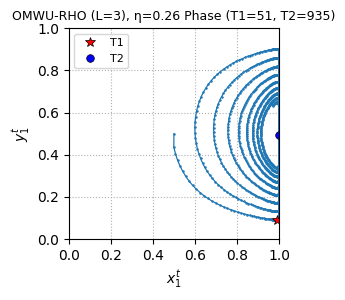

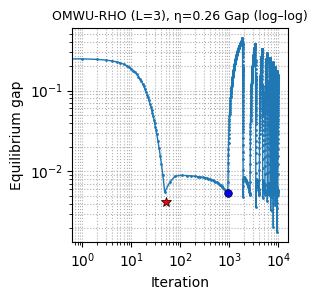

[OMWU-RHO] L=3, η=0.26  T1=51  T2=935  final_gap=0.14817036795506


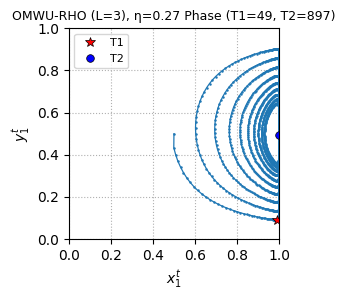

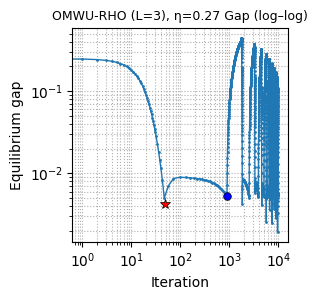

[OMWU-RHO] L=3, η=0.27  T1=49  T2=897  final_gap=0.110625401593716


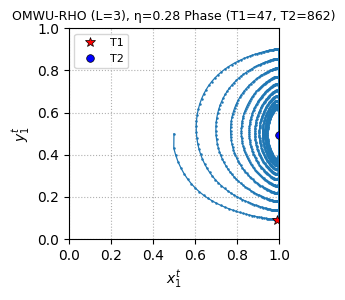

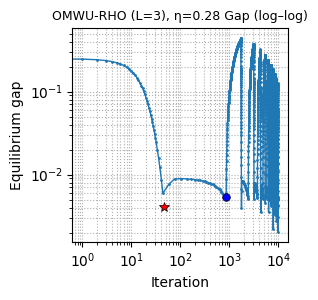

[OMWU-RHO] L=3, η=0.28  T1=47  T2=862  final_gap=0.0635890055984017


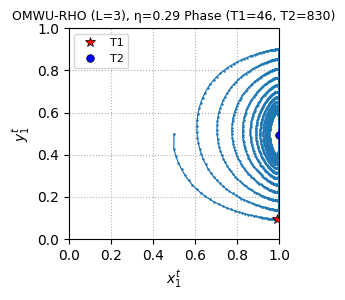

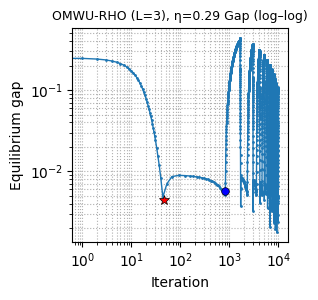

[OMWU-RHO] L=3, η=0.29  T1=46  T2=830  final_gap=0.0404627229085374


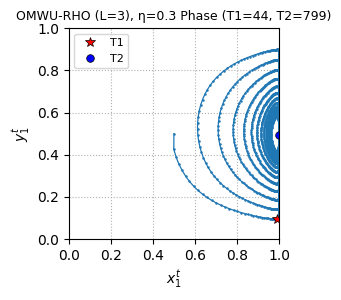

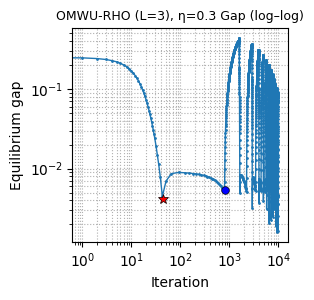

[OMWU-RHO] L=3, η=0.3  T1=44  T2=799  final_gap=0.0344137526142023


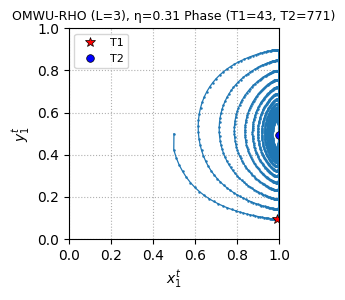

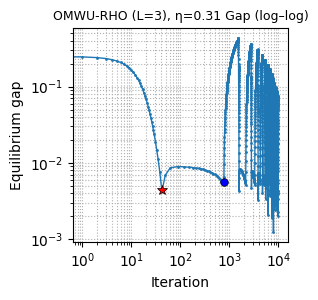

[OMWU-RHO] L=3, η=0.31  T1=43  T2=771  final_gap=0.0376329499161369


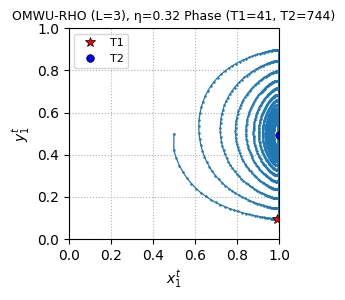

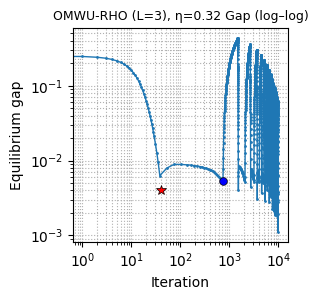

[OMWU-RHO] L=3, η=0.32  T1=41  T2=744  final_gap=0.042869757878114


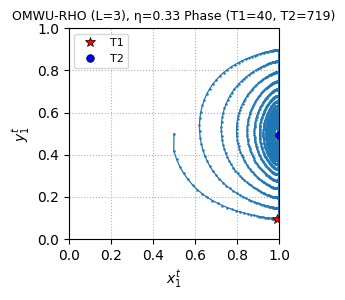

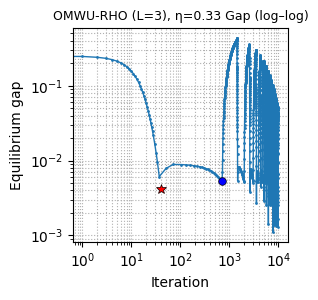

[OMWU-RHO] L=3, η=0.33  T1=40  T2=719  final_gap=0.043802425979005


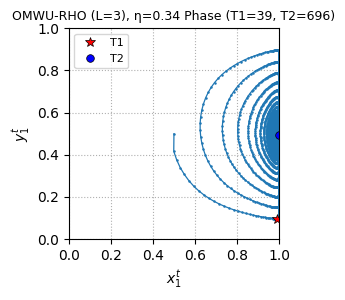

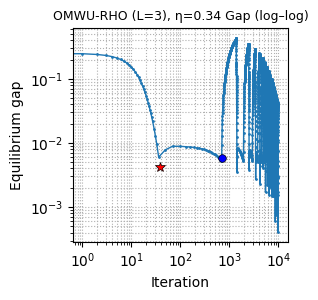

[OMWU-RHO] L=3, η=0.34  T1=39  T2=696  final_gap=0.0372521976983001


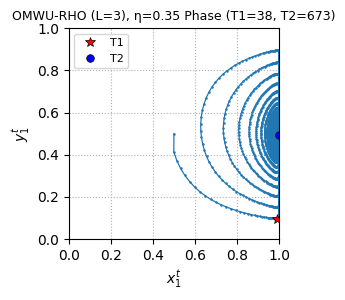

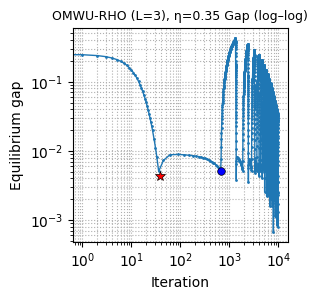

[OMWU-RHO] L=3, η=0.35  T1=38  T2=673  final_gap=0.027144794402335


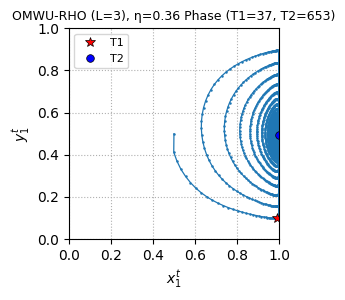

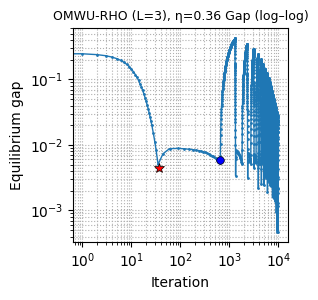

[OMWU-RHO] L=3, η=0.36  T1=37  T2=653  final_gap=0.0150929567066099


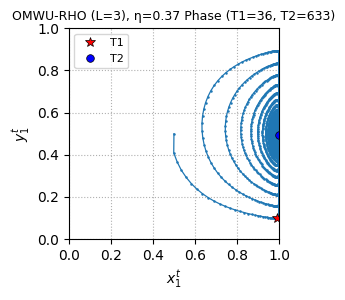

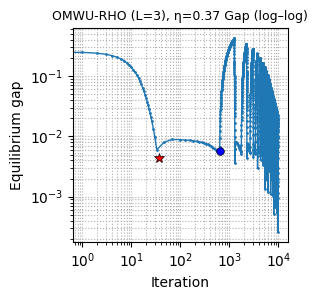

[OMWU-RHO] L=3, η=0.37  T1=36  T2=633  final_gap=0.00560551112306851


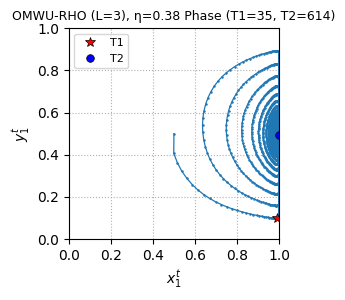

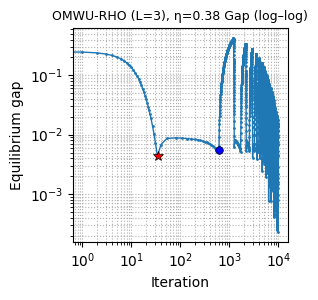

[OMWU-RHO] L=3, η=0.38  T1=35  T2=614  final_gap=0.0016086391930108


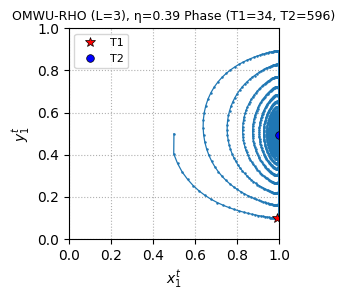

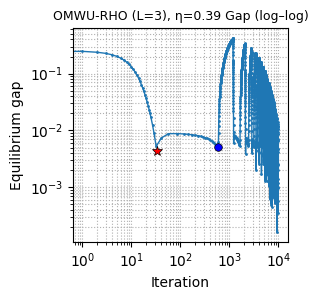

[OMWU-RHO] L=3, η=0.39  T1=34  T2=596  final_gap=0.00119536989754709


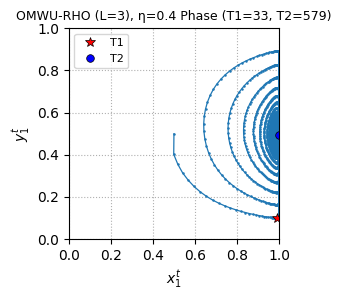

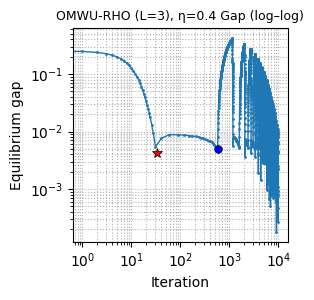

[OMWU-RHO] L=3, η=0.4  T1=33  T2=579  final_gap=0.000871228385774914


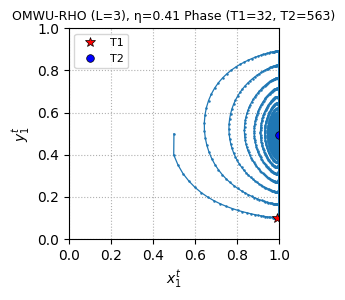

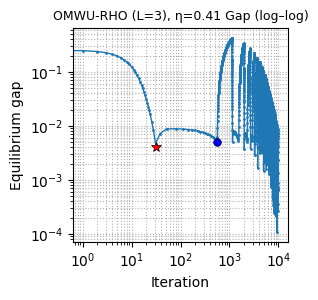

[OMWU-RHO] L=3, η=0.41  T1=32  T2=563  final_gap=0.000641682659281106


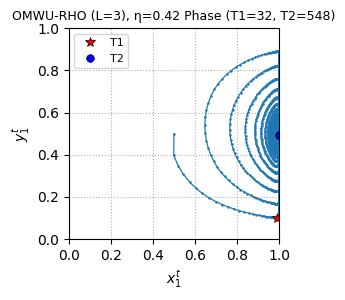

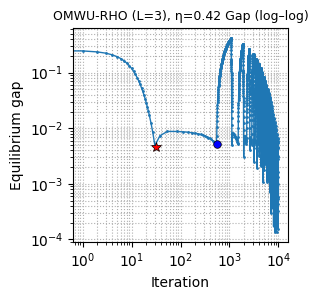

[OMWU-RHO] L=3, η=0.42  T1=32  T2=548  final_gap=0.000484225898610857


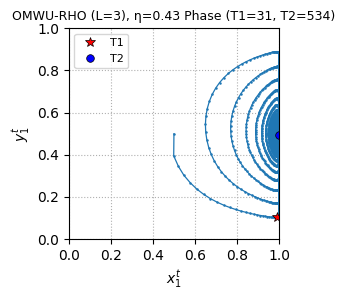

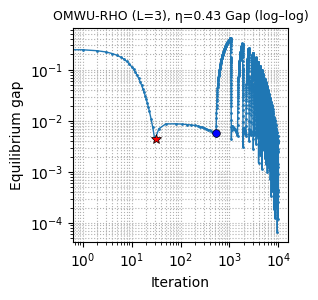

[OMWU-RHO] L=3, η=0.43  T1=31  T2=534  final_gap=0.000374441865667152


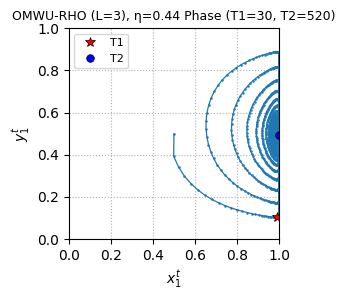

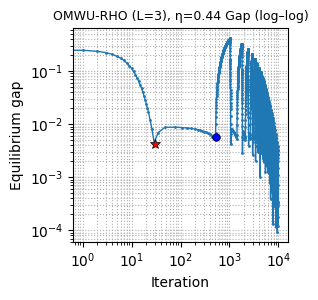

[OMWU-RHO] L=3, η=0.44  T1=30  T2=520  final_gap=0.000293484610628281


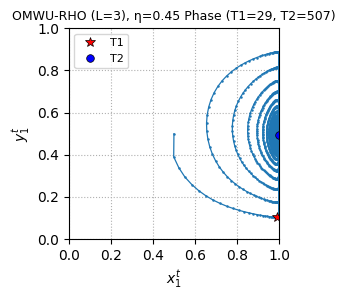

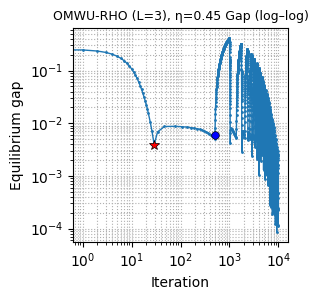

[OMWU-RHO] L=3, η=0.45  T1=29  T2=507  final_gap=0.000228960234340159


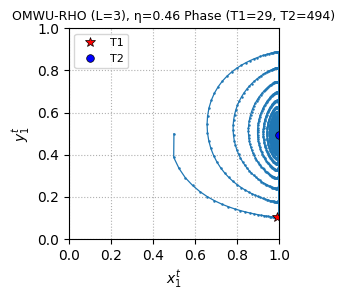

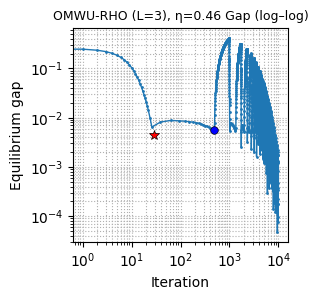

[OMWU-RHO] L=3, η=0.46  T1=29  T2=494  final_gap=0.000173877558768742


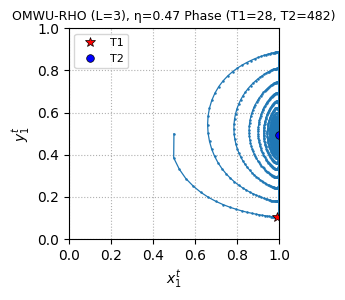

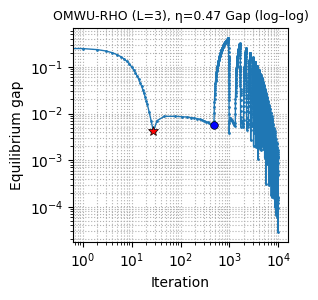

[OMWU-RHO] L=3, η=0.47  T1=28  T2=482  final_gap=0.000303785599326645


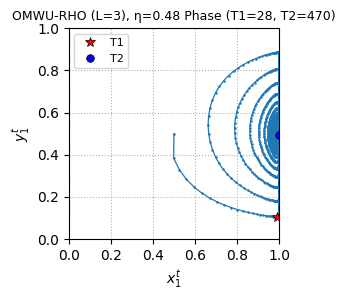

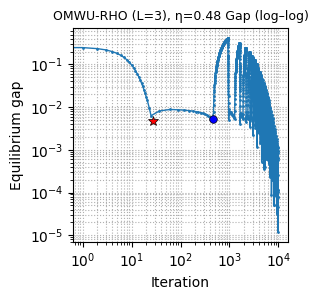

[OMWU-RHO] L=3, η=0.48  T1=28  T2=470  final_gap=0.000469496184642981


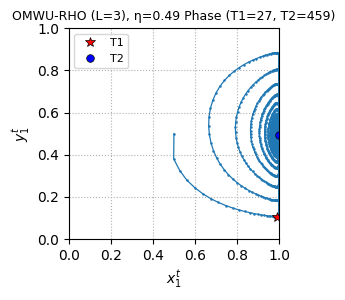

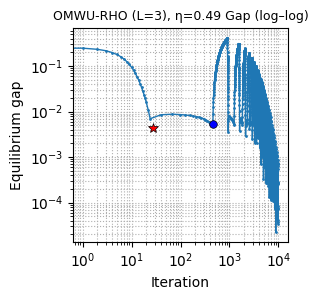

[OMWU-RHO] L=3, η=0.49  T1=27  T2=459  final_gap=0.000516720837911544


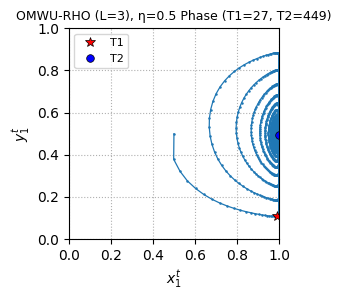

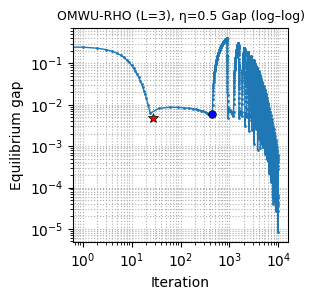

[OMWU-RHO] L=3, η=0.5  T1=27  T2=449  final_gap=0.000472093368551918


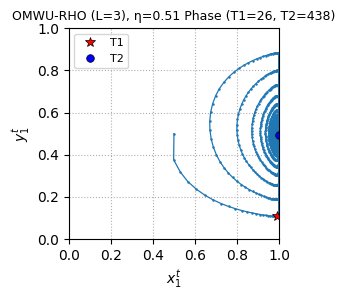

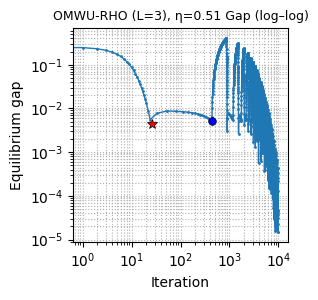

[OMWU-RHO] L=3, η=0.51  T1=26  T2=438  final_gap=0.000368837282400114


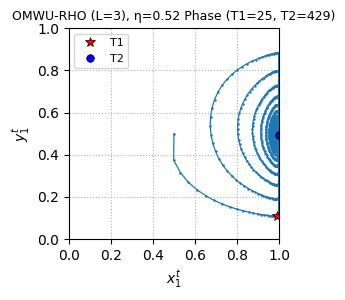

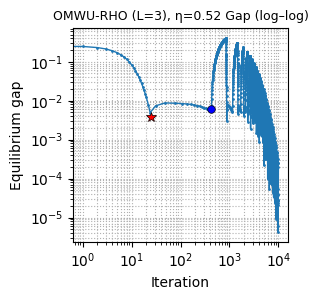

[OMWU-RHO] L=3, η=0.52  T1=25  T2=429  final_gap=0.000258632092042133


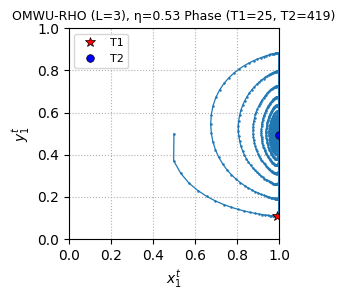

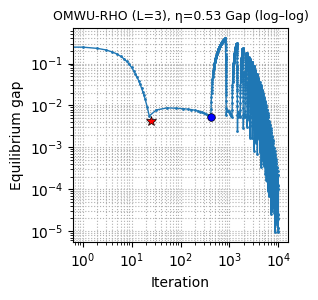

[OMWU-RHO] L=3, η=0.53  T1=25  T2=419  final_gap=0.000147527712244355


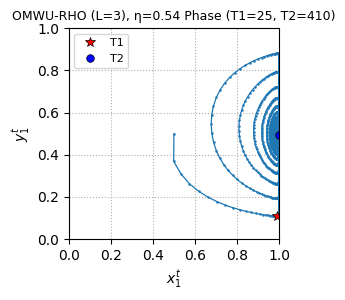

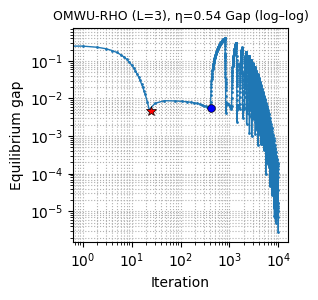

[OMWU-RHO] L=3, η=0.54  T1=25  T2=410  final_gap=5.3416382880811e-5


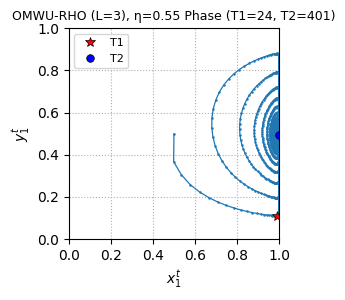

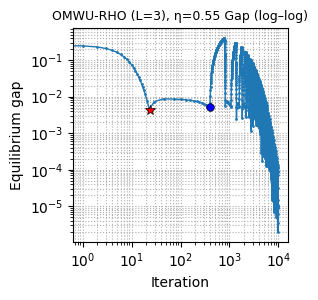

[OMWU-RHO] L=3, η=0.55  T1=24  T2=401  final_gap=9.54139812792132e-6


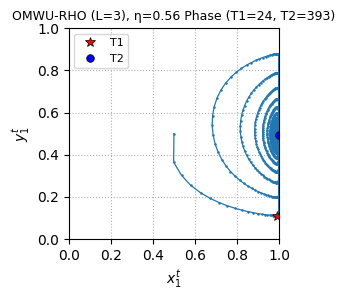

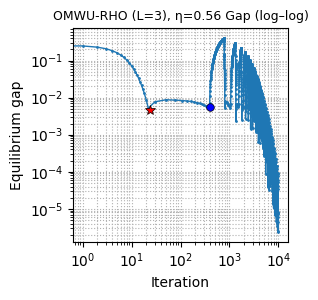

[OMWU-RHO] L=3, η=0.56  T1=24  T2=393  final_gap=5.3814602835045e-6


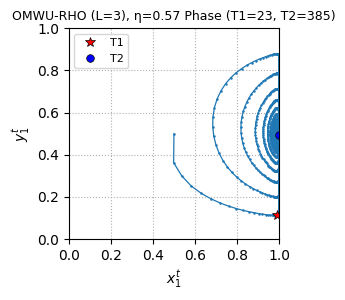

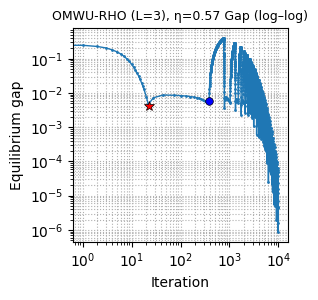

[OMWU-RHO] L=3, η=0.57  T1=23  T2=385  final_gap=1.66625590725111e-6


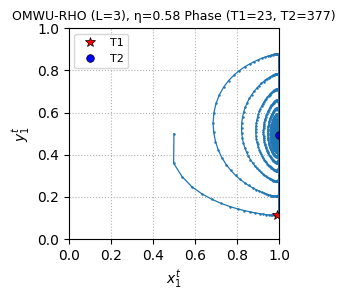

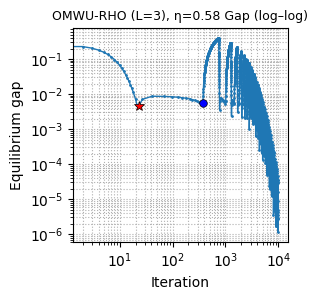

[OMWU-RHO] L=3, η=0.58  T1=23  T2=377  final_gap=1.30750086657638e-6


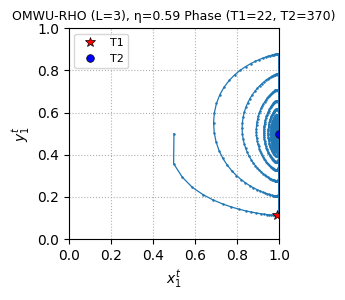

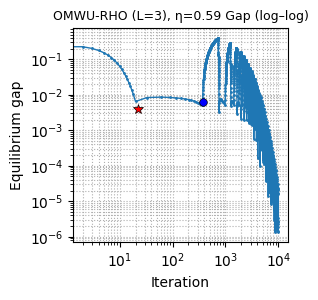

[OMWU-RHO] L=3, η=0.59  T1=22  T2=370  final_gap=1.87985816679781e-6


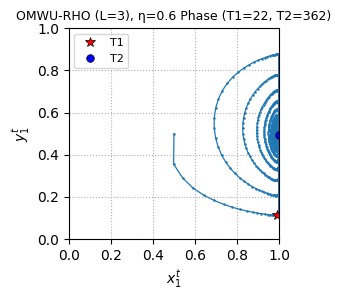

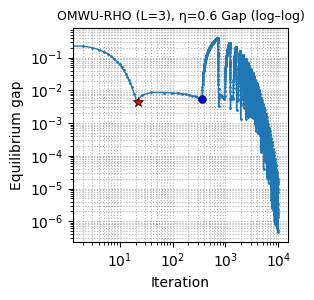

[OMWU-RHO] L=3, η=0.6  T1=22  T2=362  final_gap=1.48843753178252e-6


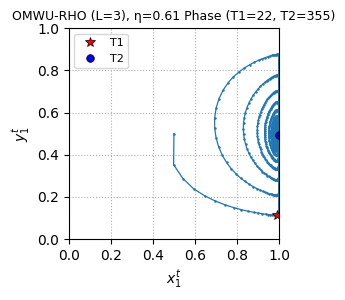

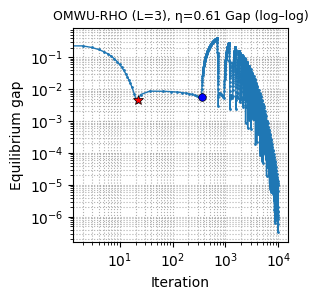

[OMWU-RHO] L=3, η=0.61  T1=22  T2=355  final_gap=6.9355466826293e-6


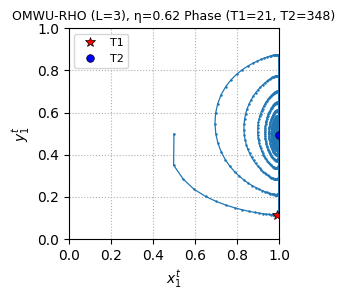

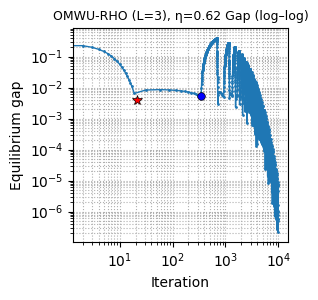

[OMWU-RHO] L=3, η=0.62  T1=21  T2=348  final_gap=6.82488900072276e-6


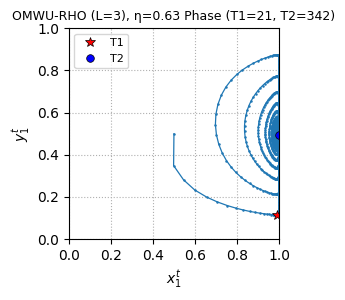

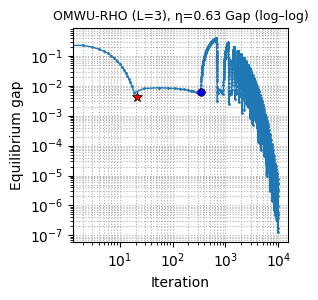

[OMWU-RHO] L=3, η=0.63  T1=21  T2=342  final_gap=4.37438674871782e-6


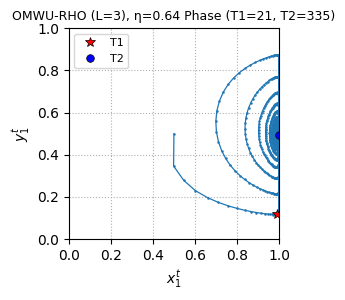

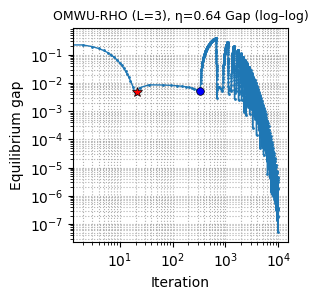

[OMWU-RHO] L=3, η=0.64  T1=21  T2=335  final_gap=1.55843242188869e-6


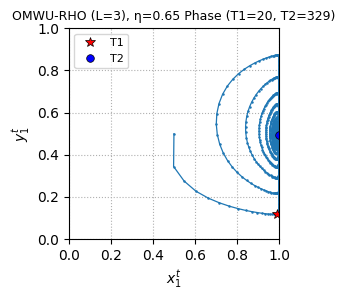

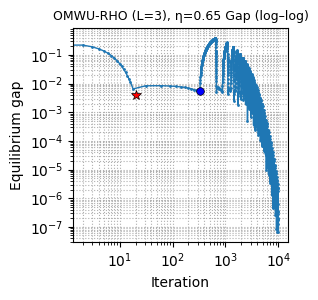

[OMWU-RHO] L=3, η=0.65  T1=20  T2=329  final_gap=2.01874942207247e-7


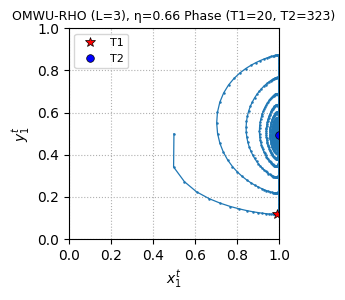

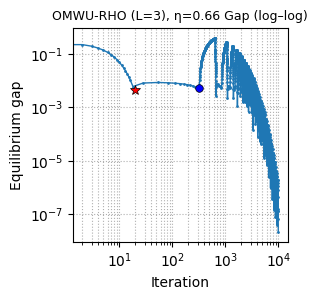

[OMWU-RHO] L=3, η=0.66  T1=20  T2=323  final_gap=8.03024039486289e-8


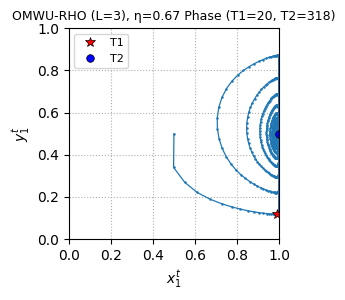

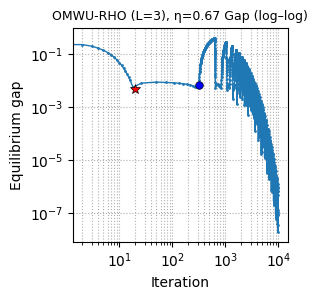

[OMWU-RHO] L=3, η=0.67  T1=20  T2=318  final_gap=2.7073566832847e-8


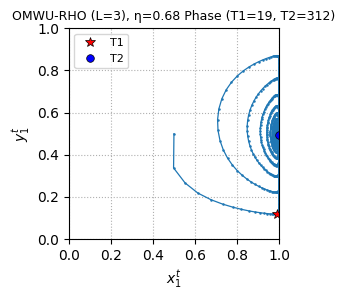

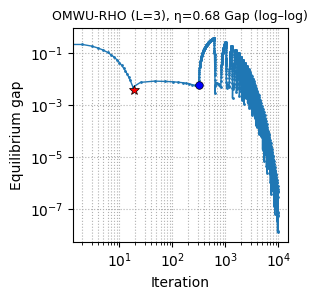

[OMWU-RHO] L=3, η=0.68  T1=19  T2=312  final_gap=4.96948916461903e-8


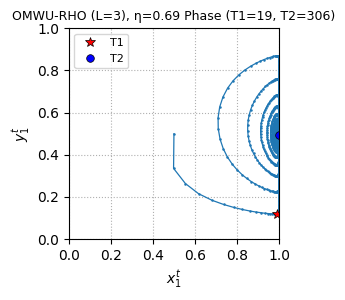

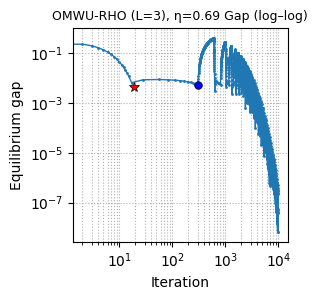

[OMWU-RHO] L=3, η=0.69  T1=19  T2=306  final_gap=1.0712848630412e-7


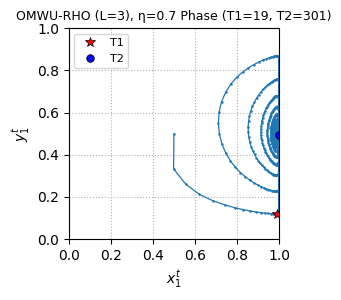

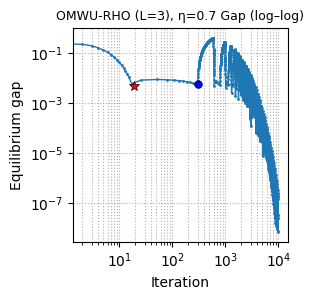

[OMWU-RHO] L=3, η=0.7  T1=19  T2=301  final_gap=2.07666839058263e-7


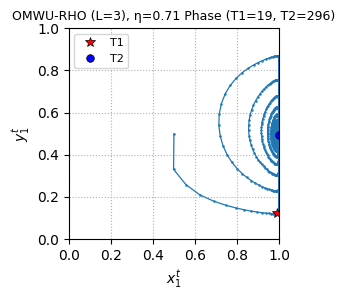

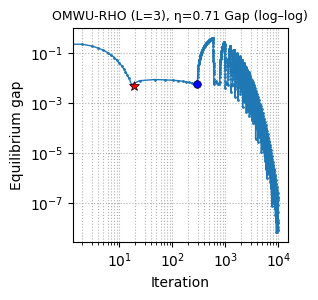

[OMWU-RHO] L=3, η=0.71  T1=19  T2=296  final_gap=1.47338857670043e-7


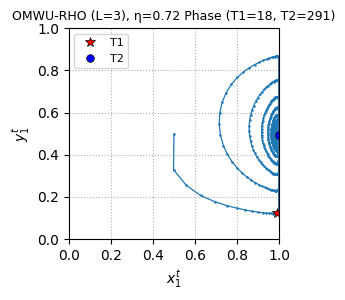

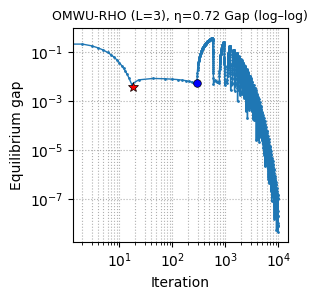

[OMWU-RHO] L=3, η=0.72  T1=18  T2=291  final_gap=5.4300967611276e-8


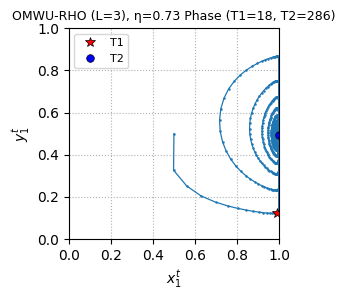

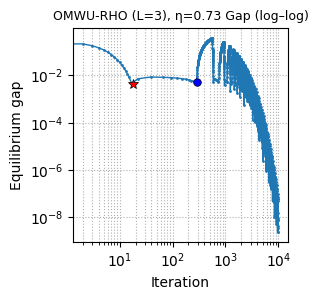

[OMWU-RHO] L=3, η=0.73  T1=18  T2=286  final_gap=5.81069270477741e-9


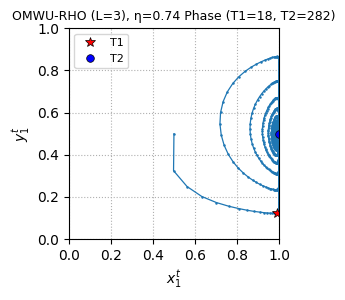

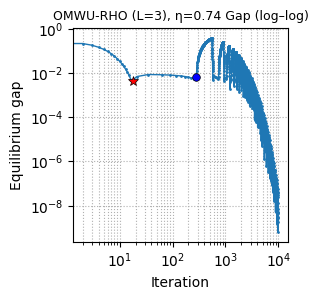

[OMWU-RHO] L=3, η=0.74  T1=18  T2=282  final_gap=1.80704773367069e-9


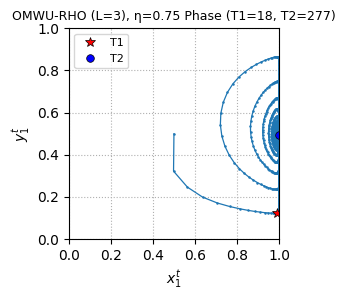

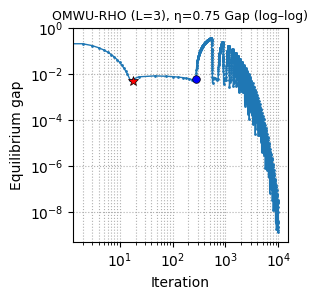

[OMWU-RHO] L=3, η=0.75  T1=18  T2=277  final_gap=1.16956955231728e-9


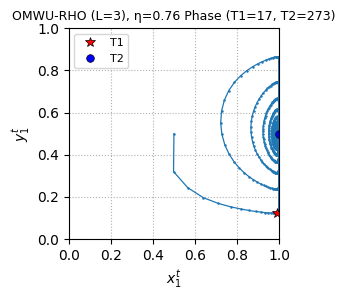

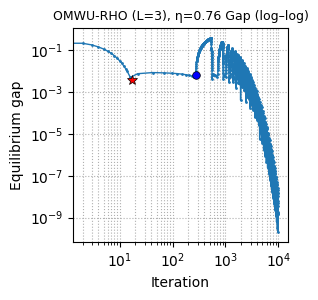

[OMWU-RHO] L=3, η=0.76  T1=17  T2=273  final_gap=1.36952249540911e-9


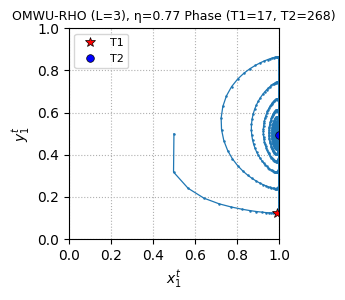

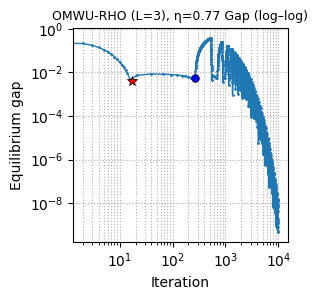

[OMWU-RHO] L=3, η=0.77  T1=17  T2=268  final_gap=5.59780966025158e-9


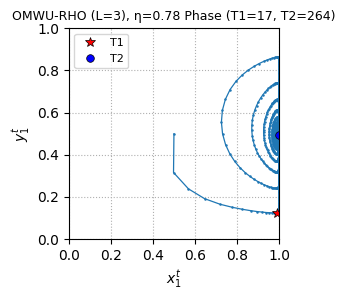

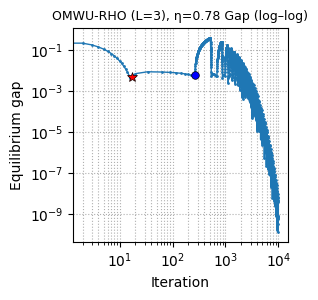

[OMWU-RHO] L=3, η=0.78  T1=17  T2=264  final_gap=5.20012033433659e-9


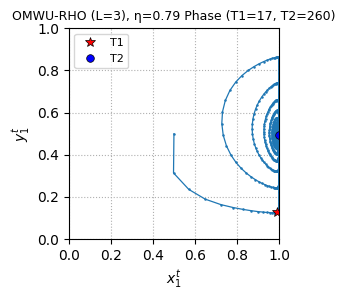

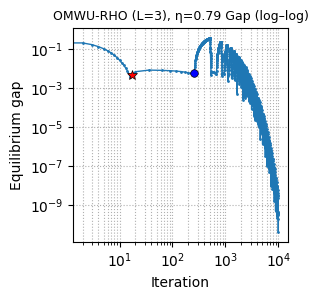

[OMWU-RHO] L=3, η=0.79  T1=17  T2=260  final_gap=2.36098152139874e-9


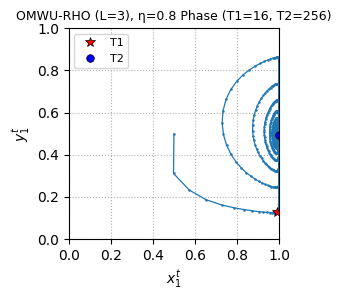

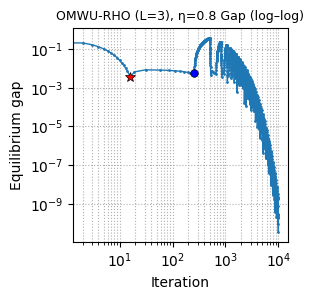

[OMWU-RHO] L=3, η=0.8  T1=16  T2=256  final_gap=1.89747217937963e-10


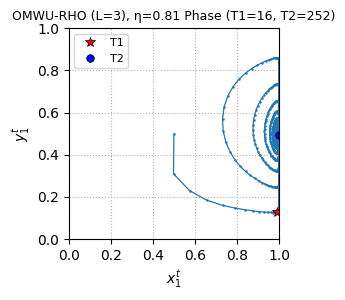

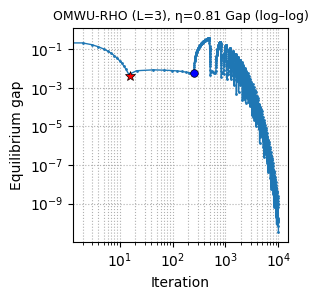

[OMWU-RHO] L=3, η=0.81  T1=16  T2=252  final_gap=6.46106501633881e-11


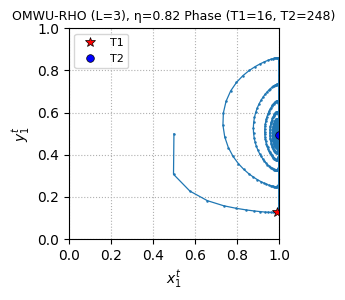

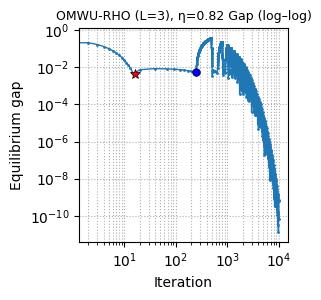

[OMWU-RHO] L=3, η=0.82  T1=16  T2=248  final_gap=3.20387050223303e-11


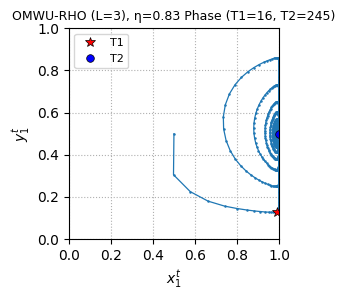

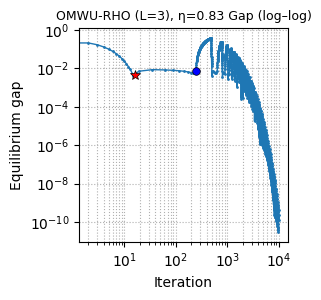

[OMWU-RHO] L=3, η=0.83  T1=16  T2=245  final_gap=3.82212039795604e-11


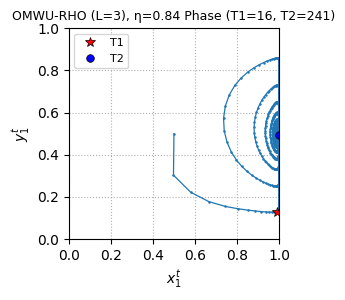

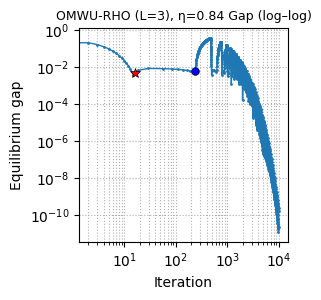

[OMWU-RHO] L=3, η=0.84  T1=16  T2=241  final_gap=1.6261270108231e-10


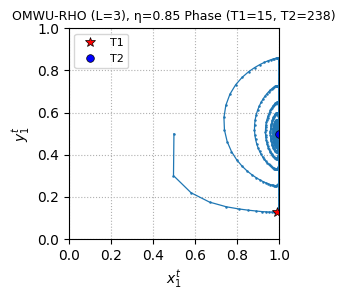

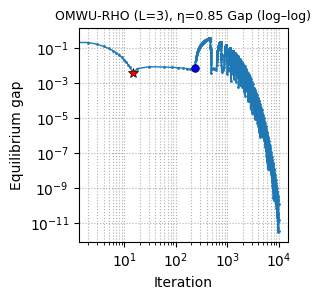

[OMWU-RHO] L=3, η=0.85  T1=15  T2=238  final_gap=1.31815003356905e-10


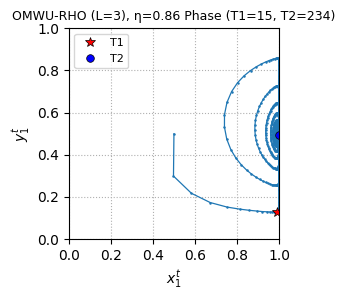

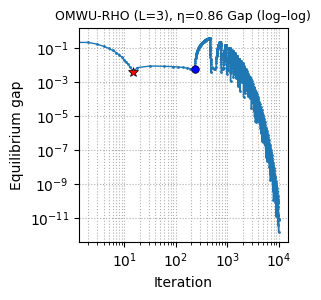

[OMWU-RHO] L=3, η=0.86  T1=15  T2=234  final_gap=4.63202809442009e-11


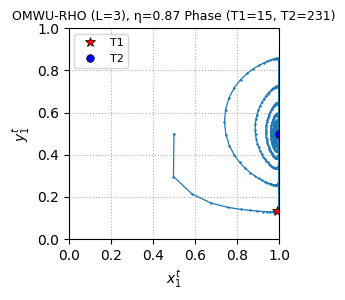

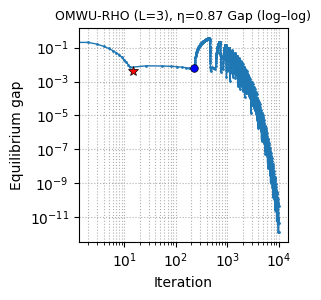

[OMWU-RHO] L=3, η=0.87  T1=15  T2=231  final_gap=4.19375645321907e-12


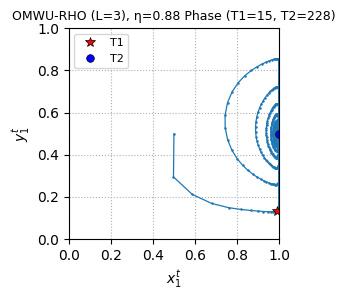

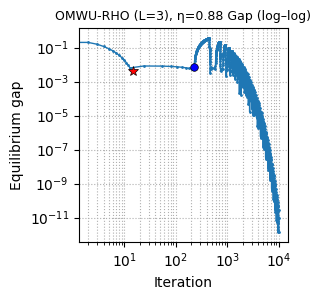

[OMWU-RHO] L=3, η=0.88  T1=15  T2=228  final_gap=7.5994766035592e-13


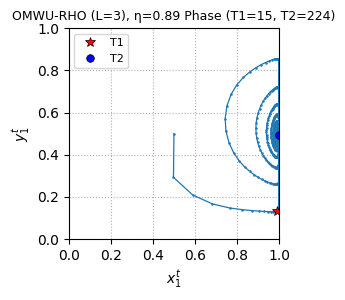

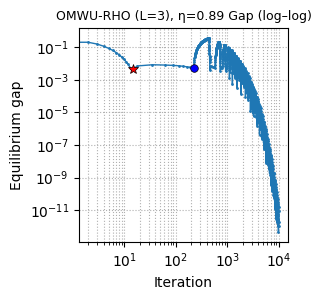

[OMWU-RHO] L=3, η=0.89  T1=15  T2=224  final_gap=1.04483088847473e-12


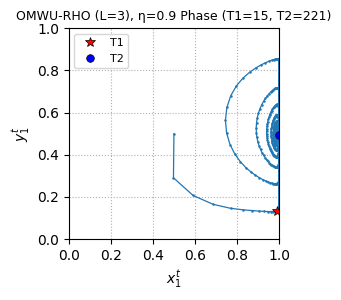

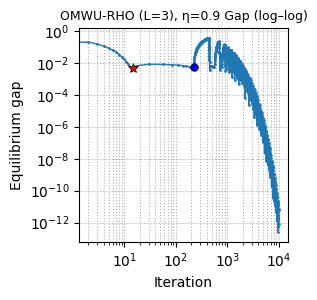

[OMWU-RHO] L=3, η=0.9  T1=15  T2=221  final_gap=1.99129601696768e-12


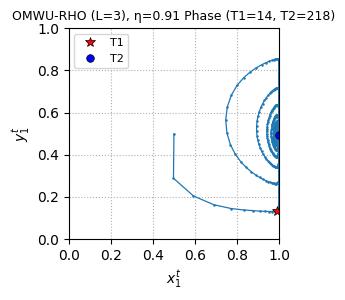

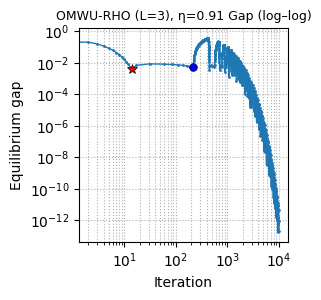

[OMWU-RHO] L=3, η=0.91  T1=14  T2=218  final_gap=4.12103684510612e-12


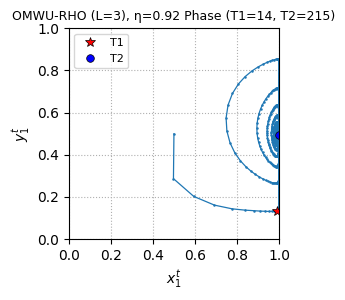

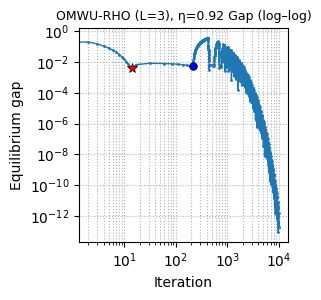

[OMWU-RHO] L=3, η=0.92  T1=14  T2=215  final_gap=2.17614815056777e-12


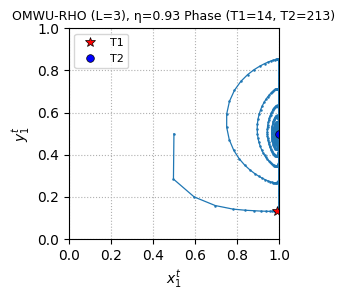

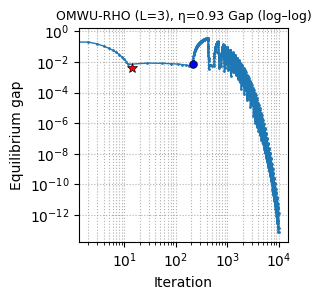

[OMWU-RHO] L=3, η=0.93  T1=14  T2=213  final_gap=1.74193992563687e-13


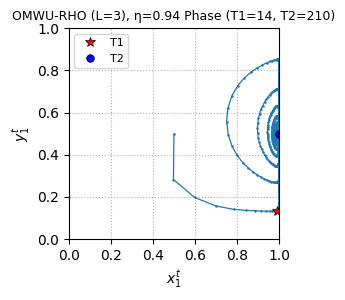

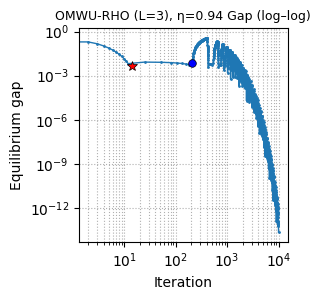

[OMWU-RHO] L=3, η=0.94  T1=14  T2=210  final_gap=4.76285677564192e-14


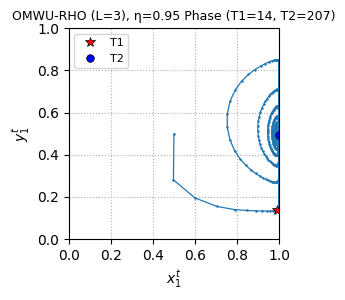

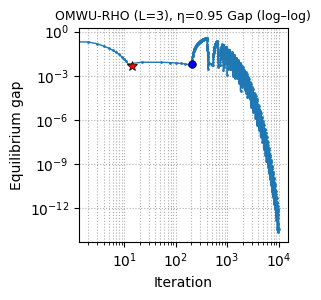

[OMWU-RHO] L=3, η=0.95  T1=14  T2=207  final_gap=1.84297022087776e-14


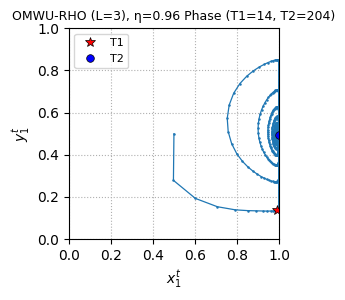

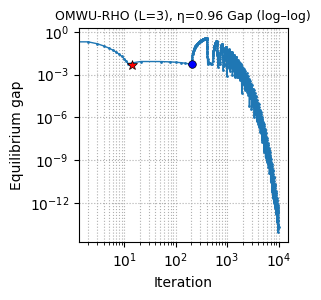

[OMWU-RHO] L=3, η=0.96  T1=14  T2=204  final_gap=2.09832151654155e-14


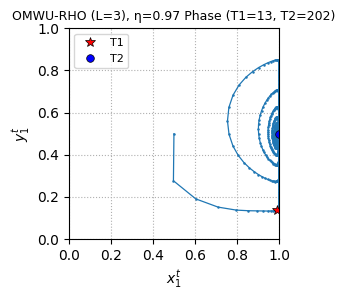

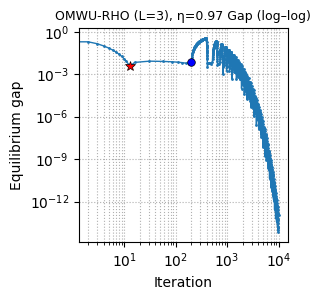

[OMWU-RHO] L=3, η=0.97  T1=13  T2=202  final_gap=9.14823772291129e-14


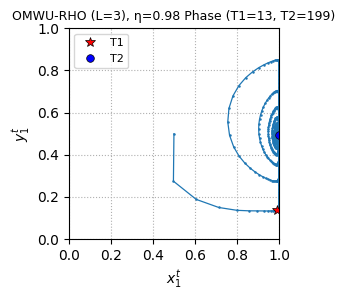

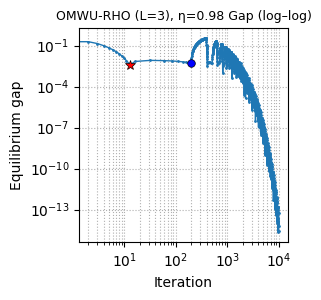

[OMWU-RHO] L=3, η=0.98  T1=13  T2=199  final_gap=5.89528426075958e-14


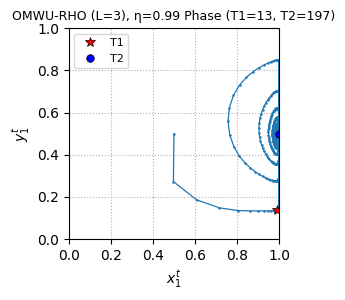

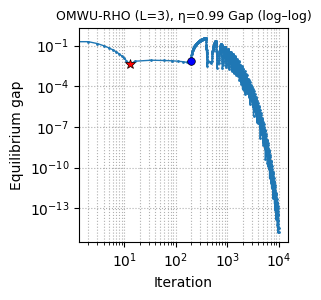

[OMWU-RHO] L=3, η=0.99  T1=13  T2=197  final_gap=1.16573417585641e-14


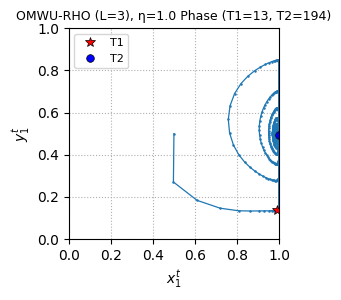

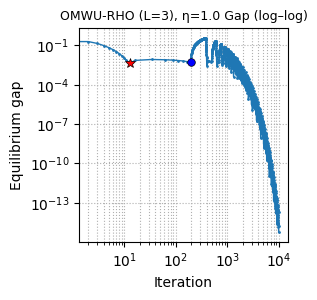

[OMWU-RHO] L=3, η=1.0  T1=13  T2=194  final_gap=1.22124532708767e-15


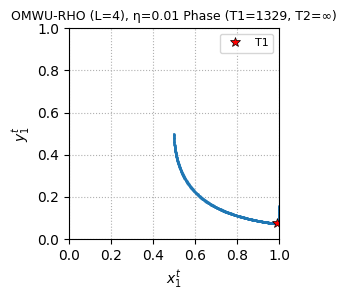

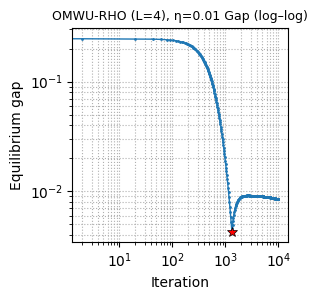

[OMWU-RHO] L=4, η=0.01  T1=1329  T2=∞  final_gap=0.00842634004081588


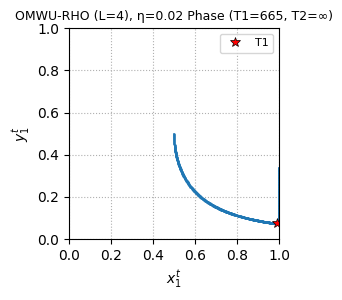

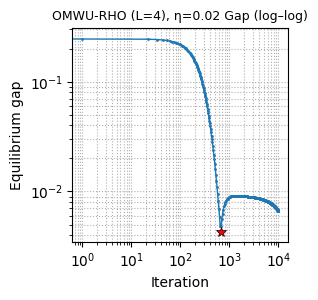

[OMWU-RHO] L=4, η=0.02  T1=665  T2=∞  final_gap=0.00660522723675483


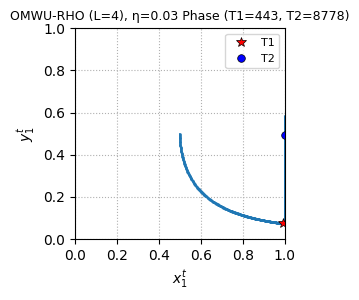

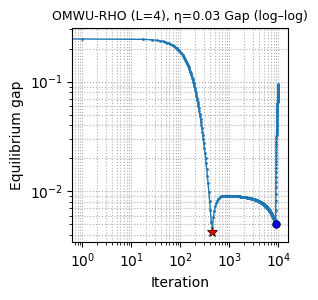

[OMWU-RHO] L=4, η=0.03  T1=443  T2=8778  final_gap=0.095792720480697


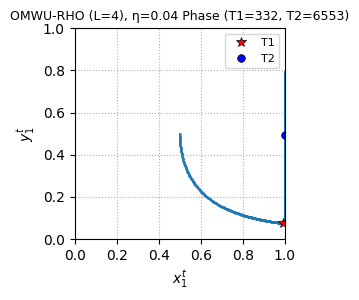

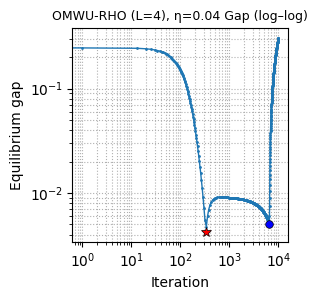

[OMWU-RHO] L=4, η=0.04  T1=332  T2=6553  final_gap=0.305550879807174


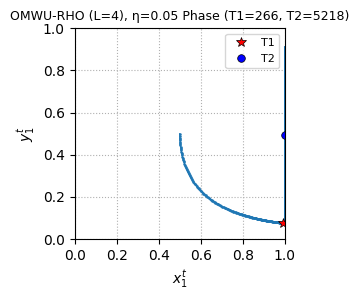

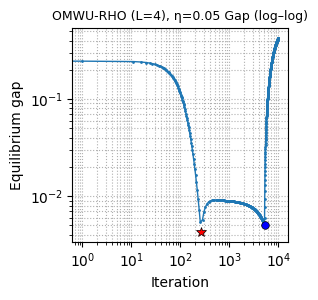

[OMWU-RHO] L=4, η=0.05  T1=266  T2=5218  final_gap=0.424142430955503


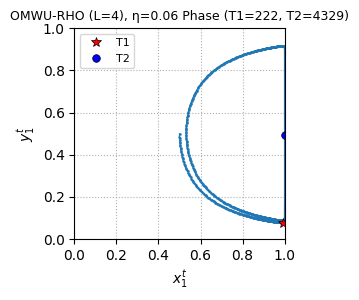

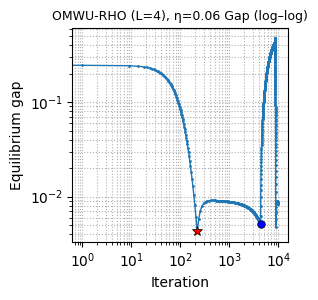

[OMWU-RHO] L=4, η=0.06  T1=222  T2=4329  final_gap=0.00838861335803875


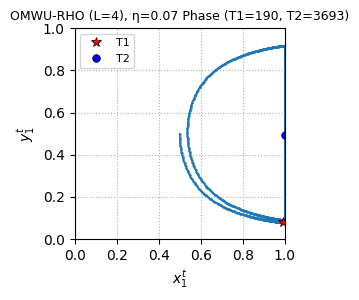

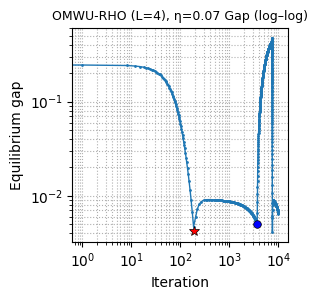

[OMWU-RHO] L=4, η=0.07  T1=190  T2=3693  final_gap=0.00644038415975923


In [ ]:
# ==========================================================
# OMWU family sweeps on the forgetfulness toy game
# Adds: OMWU-DECAY, OMWU-KD, OMWU-RHO
# - Uniform starts
# - Entropy-OMD (logit) prox updates
# - η sweep: 0.01 .. 1.00 (step 0.01) for all variants
# - L sweep: 2..5 for EO/EOO/L/DECAY/RHO (KD has fixed K=10,D=5)
# - First-step rule: for extra-optimism families (EO/EOO/L/DECAY), use d0 = 3*g0
# - After each run: Phase plot + Log-gap plot
# - After each variant: print/report + replot best run (fewest steps to T2)
# - Final overlay of best gap curves across ALL variants
# ==========================================================

import numpy as np
import matplotlib.pyplot as plt
from dataclasses import dataclass
from typing import List, Tuple, Optional, Dict, Any

import mpmath as mp
mp.dps = 1000  # High precision (lower to speed up large sweeps)

# -----------------------------
# Global sweep settings
# -----------------------------
DELTA      = mp.mpf("1e-2")   # toy game parameter
T_STEPS    = 10000            # iterations per run
ETA_START  = 0.01
ETA_END    = 1.00
ETA_STEP   = 0.01
L_MIN      = 2
L_MAX      = 5
DISPLAY    = True             # set False to suppress per-run plots
SEED       = 0

# For OMWU-RHO (EWMA smoothing): fixed rho parameter (0<rho<1),
# weights ~ (1-rho) * rho^{i-1}, normalized over the active window.
RHO_CONST  = mp.mpf("0.7")

# For OMWU-KD (keep recent half): window K, drop D oldest each K steps.
KD_K       = 10
KD_D       = 5

# -----------------------------
# Game: 2x2 zero-sum (row util matrix A)
# A(delta) = -[[1/2+δ, 1/2], [0, 1]]
# -----------------------------
def game_matrix(delta: mp.mpf) -> np.ndarray:
    return -np.array([[mp.mpf("0.5")+delta, mp.mpf("0.5")],
                      [mp.mpf("0"),         mp.mpf("1.0")]], dtype=object)

# -----------------------------
# Numerics helpers (mp-compatible)
# -----------------------------
def entropy_prox_dir(d: np.ndarray, x_prev: np.ndarray, eta: mp.mpf) -> np.ndarray:
    # Mirror step (logit): x' ∝ x_prev ⊙ exp(eta*d)
    m = max(d[0], d[1])
    a = x_prev[0] * mp.e**(eta * (d[0]-m))
    b = x_prev[1] * mp.e**(eta * (d[1]-m))
    s = a + b
    return np.array([a/s, b/s], dtype=object)

def simplex_renorm(v: np.ndarray, eps: mp.mpf = mp.mpf("1e-80")) -> np.ndarray:
    """Clip to [0,1], renorm to sum 1, robust against tiny drift."""
    v0 = v[0]; v1 = v[1]
    if not (mp.isfinite(v0) and mp.isfinite(v1)):
        return np.array([mp.mpf("0.5"), mp.mpf("0.5")], dtype=object)
    v0 = max(mp.mpf("0"), min(mp.mpf("1"), v0))
    v1 = max(mp.mpf("0"), min(mp.mpf("1"), v1))
    s = v0 + v1
    if s <= eps:
        return np.array([mp.mpf("0.5"), mp.mpf("0.5")], dtype=object)
    v0 /= s; v1 /= s
    v0 = max(mp.mpf("0"), min(mp.mpf("1"), v0))
    v1 = max(mp.mpf("0"), min(mp.mpf("1"), v1))
    s2 = v0 + v1
    if s2 <= eps:
        return np.array([mp.mpf("0.5"), mp.mpf("0.5")], dtype=object)
    return np.array([v0/s2, v1/s2], dtype=object)

# -----------------------------
# Gradients
# -----------------------------
def row_grad(A: np.ndarray, y: np.ndarray) -> np.ndarray:
    return np.array([A[0,0]*y[0] + A[0,1]*y[1],
                     A[1,0]*y[0] + A[1,1]*y[1]], dtype=object)

def col_grad(A: np.ndarray, x: np.ndarray) -> np.ndarray:
    return np.array([-(A[0,0]*x[0] + A[1,0]*x[1]),
                     -(A[0,1]*x[0] + A[1,1]*x[1])], dtype=object)

# -----------------------------
# Variant state + directions
# -----------------------------
@dataclass
class OMState:
    last_g: np.ndarray
    hist: List[np.ndarray]      # rolling list: most recent first
    sum_hist: np.ndarray        # for OMWU-L
    pending: np.ndarray         # for OMWU-EOO
    L: int
    # KD / RHO internals
    buffer: List[np.ndarray]    # KD buffer of previous grads (oldest .. newest)
    K: int
    D: int
    t: int                      # step counter
    rho: mp.mpf                 # for RHO EWMA

def init_om_state(L: int,
                  K: int = KD_K,
                  D: int = KD_D,
                  rho: mp.mpf = RHO_CONST) -> OMState:
    z = np.zeros(2, dtype=object)
    return OMState(
        last_g=z.copy(), hist=[], sum_hist=z.copy(), pending=z.copy(),
        L=int(L), buffer=[], K=int(K), D=int(D), t=0, rho=mp.mpf(rho)
    )

def ewma_over_hist(hist: List[np.ndarray], L: int, rho: mp.mpf) -> np.ndarray:
    """Normalized EWMA over the last <= L previous gradients in 'hist' (most recent first)."""
    if not hist:
        return np.zeros(2, dtype=object)
    take = min(L, len(hist))
    num = np.zeros(2, dtype=object)
    denom = mp.mpf("0")
    for i in range(take):
        w = (1 - rho) * (rho ** i)   # unnormalized EWMA weight
        num = num + w * hist[i]
        denom += w
    if denom == 0:
        return np.zeros(2, dtype=object)
    return num / denom

def variant_direction(name: str, st: OMState, g_t: np.ndarray) -> np.ndarray:
    """
    Return direction d_t for the variant and update any carry-over state
    that logically advances with time (hist, sum_hist, pending, KD buffer).
    'st.t' is the step index (0-based) maintained by the simulator.
    """
    v = name.upper()
    L = st.L

    if v == "OMWU":
        d = 2*g_t - st.last_g

    elif v == "OMWU-EO":
        d = (L+1)*g_t - L*st.last_g

    elif v == "OMWU-L":
        d = (L+1)*g_t - st.sum_hist
        # push current into history AFTER forming d_t
        st.hist.insert(0, g_t.copy())
        st.sum_hist = st.sum_hist + g_t
        if len(st.hist) > L:
            old = st.hist.pop()
            st.sum_hist = st.sum_hist - old

    elif v == "OMWU-EOO":
        d = (L+1)*g_t - st.last_g - st.pending
        coef = max(L-1, 0)
        st.pending = coef * st.last_g

    elif v == "OMWU-DECAY":
        # d_t = (L+1) g_t - g_{t-1} - (L-1) g_{t-L}
        g_t_minus_L = st.hist[L-1] if len(st.hist) >= L else np.zeros(2, dtype=object)
        d = (L+1)*g_t - st.last_g - max(L-1, 0) * g_t_minus_L
        # maintain hist (store previous grads; current goes in AFTER forming d_t)
        st.hist.insert(0, g_t.copy())
        if len(st.hist) > L:
            st.hist.pop()  # keep only last L for efficiency

    elif v == "OMWU-KD":
        # Prediction = mean of buffer of previous grads (active window),
        # where buffer keeps up to K items and every K steps we drop D oldest.
        if len(st.buffer) == 0:
            m = np.zeros(2, dtype=object)
        else:
            m = sum(st.buffer) / mp.mpf(len(st.buffer))
        d = 2*g_t - m
        # update buffer: append current grad AFTER using it for d_t
        st.buffer.append(g_t.copy())
        # If we just finished a block of K steps, drop the oldest D
        if (st.t + 1) % st.K == 0 and len(st.buffer) >= st.K:
            st.buffer = st.buffer[st.D:]  # delete first D

    elif v == "OMWU-RHO":
        # OMWU with EWMA prediction over last L prev grads: d_t = 2g_t - m_t
        m = ewma_over_hist(st.hist, L=L, rho=st.rho)
        d = 2*g_t - m
        # push current grad into hist AFTER forming d_t
        st.hist.insert(0, g_t.copy())
        if len(st.hist) > L:
            st.hist.pop()

    else:
        raise ValueError(f"Unknown variant '{name}'")

    return d

# -----------------------------
# T1/T2 & plotting helpers
# -----------------------------
def find_T1_T2(xs: List[mp.mpf], ys: List[mp.mpf], delta: mp.mpf) -> Tuple[int,int]:
    T1 = None
    for t, x in enumerate(xs):
        if x >= 1/(1+delta):
            T1 = t; break
    if T1 is None: T1 = 0
    T2 = None
    for t, y in enumerate(ys):
        if t > T1 and y >= (mp.mpf("0.5")/(1+delta)):
            T2 = t; break
    if T2 is None: T2 = mp.inf  # mark as not reached
    return T1, T2

def filter_data(xs, ys, gaps, ts, tol=mp.mpf("3e-3")):
    xs_f, ys_f, gaps_f, ts_f = [xs[0]], [ys[0]], [gaps[0]], [ts[0]]
    xr = max(xs) - min(xs)
    for (x, y, g, t) in zip(xs, ys, gaps, ts):
        if xr == 0:
            cond = abs(y - ys_f[-1]) > tol
        else:
            cond = abs(x - xs_f[-1])/xr + abs(y - ys_f[-1]) > tol
        if cond:
            xs_f.append(x); ys_f.append(y); gaps_f.append(g); ts_f.append(t)
    return xs_f, ys_f, gaps_f, ts_f

def plot_phase(xs, ys, ts, delta, T1, T2, title_prefix=""):
    xs_f, ys_f, _, _ = filter_data(xs, ys, ys, ts)
    fig, ax = plt.subplots(1, 1, figsize=(3.1, 3.1))
    ax.plot(xs_f, ys_f, 'o-', ms=0.8, lw=0.9)
    ax.plot([xs[T1]],[ys[T1]], 'r*', ms=7, mec='black', mew=0.5, label='T1')
    if T2 is not mp.inf:
        ax.plot([xs[T2]],[ys[T2]], 'o', ms=5.5, mec='black', mfc='blue', mew=0.5, label='T2')
    ax.set_xlabel("$x^t_1$"); ax.set_ylabel("$y^t_1$")
    ax.set_ylim(0,1); ax.set_xlim(0,1); ax.grid(True, ls=':')
    ax.legend(loc='best', fontsize=8)
    ax.set_title(f"{title_prefix} Phase (T1={T1}, T2={'∞' if T2 is mp.inf else T2})", fontsize=9)
    plt.tight_layout()
    if DISPLAY: plt.show(); plt.close(fig)
    else: plt.close(fig)

def plot_gap(ts, gaps, T1, T2, title_prefix=""):
    xs_t = ts
    ys_g = gaps
    xs_f, ys_f, _, _ = filter_data(xs_t, ys_g, ys_g, ts)
    fig, ax = plt.subplots(1, 1, figsize=(3.1, 3.1))
    ax.loglog(xs_f, ys_f, 'o-', ms=1.0, lw=1.0)
    ax.loglog([T1], [gaps[T1]], 'r*', ms=7, mec='black', mew=0.5)
    if T2 is not mp.inf:
        ax.loglog([T2], [gaps[T2]], 'o', ms=5.5, mec='black', mfc='blue', mew=0.5)
    ax.set_xlabel("Iteration"); ax.set_ylabel("Equilibrium gap")
    ax.grid(True, which='both', ls=':')
    ax.set_title(f"{title_prefix} Gap (log–log)", fontsize=9)
    plt.tight_layout()
    if DISPLAY: plt.show(); plt.close(fig)
    else: plt.close(fig)

# -----------------------------
# One run for a given (variant, eta, L)
# -----------------------------
def simulate_run(A: np.ndarray,
                 variant_name: str,
                 eta: mp.mpf,
                 L: Optional[int],
                 T: int) -> Dict[str, Any]:
    # Uniform starts
    x = np.array([mp.mpf("0.5"), mp.mpf("0.5")], dtype=object)
    y = np.array([mp.mpf("0.5"), mp.mpf("0.5")], dtype=object)

    # Per-player state
    L_eff = 0 if L is None else int(L)
    stx = init_om_state(L_eff)
    sty = init_om_state(L_eff)

    xs, ys, gaps, ts = [], [], [], []

    extra_variants = {"OMWU-EO", "OMWU-EOO", "OMWU-L", "OMWU-DECAY"}

    for t in range(T):
        stx.t = t; sty.t = t

        gx = row_grad(A, y)
        gy = col_grad(A, x)

        # record current point & gap proxy
        xs.append(x[0]); ys.append(y[0]); ts.append(t)
        gaps.append(max(gx[0], gx[1]) + max(gy[0], gy[1]))

        v = variant_name.upper()

        if v in extra_variants and t == 0:
            # Extra-optimism first step: one notch above OMWU
            dx = 3 * gx
            dy = 3 * gy
            # Apply update
            x = entropy_prox_dir(dx, x, eta); x = simplex_renorm(x)
            y = entropy_prox_dir(dy, y, eta); y = simplex_renorm(y)
            # Initialize state so recurrence is correct from t>=1
            stx.last_g = gx; sty.last_g = gy
            # Prepare histories if the variant needs them
            if v in {"OMWU-L", "OMWU-DECAY", "OMWU-RHO"}:
                stx.hist.insert(0, gx.copy())
                sty.hist.insert(0, gy.copy())
                stx.sum_hist = stx.sum_hist + gx
                sty.sum_hist = sty.sum_hist + gy
        else:
            # Regular direction step
            dx = variant_direction(variant_name, stx, gx)
            dy = variant_direction(variant_name, sty, gy)
            x = entropy_prox_dir(dx, x, eta); x = simplex_renorm(x)
            y = entropy_prox_dir(dy, y, eta); y = simplex_renorm(y)
            stx.last_g = gx; sty.last_g = gy

        # robust sanity
        assert abs((x[0]+x[1]) - 1) < mp.mpf("1e-50") and x[0] >= 0 and x[1] >= 0
        assert abs((y[0]+y[1]) - 1) < mp.mpf("1e-50") and y[0] >= 0 and y[1] >= 0

    # T1/T2
    T1, T2 = find_T1_T2(xs, ys, DELTA)
    steps_to_T2 = T2 if T2 is not mp.inf else mp.inf

    return {
        "xs": xs, "ys": ys, "gaps": gaps, "ts": ts,
        "T1": T1, "T2": T2, "steps_to_T2": steps_to_T2
    }

# -----------------------------
# Variant sweep runner
# -----------------------------
def run_variant(variant_name: str,
                A: np.ndarray,
                eta_values: List[float],
                L_values: Optional[List[int]],
                T: int):
    print(f"\n=== Sweeping {variant_name} ===")
    best_record = None  # (steps_to_T2, final_gap, eta, L, result dict)

    for L in (L_values or [None]):
        for eta_f in eta_values:
            eta = mp.mpf(f"{eta_f:.2f}")
            res = simulate_run(A, variant_name, eta, L, T)

            # Per-run plots
            title = f"{variant_name}" + (f" (L={L})" if L is not None else "") + f", η={eta}"
            if DISPLAY:
                plot_phase(res["xs"], res["ys"], res["ts"], DELTA, res["T1"], res["T2"], title_prefix=title)
                plot_gap(res["ts"], res["gaps"], res["T1"], res["T2"], title_prefix=title)

            # Summaries
            final_gap = res["gaps"][-1]
            steps = res["steps_to_T2"]
            steps_print = "∞" if steps is mp.inf else str(steps)
            print(f"[{variant_name}] " + (f"L={L}, " if L is not None else "") +
                  f"η={eta}  T1={res['T1']}  T2={steps_print}  final_gap={final_gap}")

            # Track best: min steps_to_T2; tie-breaker: smaller final gap; then smaller η
            key = (steps, float(final_gap), float(eta))
            if best_record is None or key < best_record[0]:
                best_record = (key, eta, L, res)

    # Report + re-plot best for this variant
    _, best_eta, best_L, best_res = best_record
    print(f"\n>>> BEST for {variant_name}: " +
          (f"L={best_L}, " if best_L is not None else "") +
          f"η={best_eta}  T2={'∞' if best_res['T2'] is mp.inf else best_res['T2']}  "
          f"T1={best_res['T1']}  final_gap={best_res['gaps'][-1]}")

    best_title = f"[BEST] {variant_name}" + (f" (L={best_L})" if best_L is not None else "") + f", η={best_eta}"
    if DISPLAY:
        plot_phase(best_res["xs"], best_res["ys"], best_res["ts"], DELTA, best_res["T1"], best_res["T2"], title_prefix=best_title)
        plot_gap(best_res["ts"], best_res["gaps"], best_res["T1"], best_res["T2"], title_prefix=best_title)

    return {
        "variant": variant_name,
        "eta": best_eta,
        "L": best_L,
        "res": best_res
    }

# -----------------------------
# Driver: run all variants and show final overlay
# -----------------------------
if __name__ == "__main__":
    rng = np.random.default_rng(SEED)
    A = game_matrix(DELTA)

    # Build eta list
    eta_values = [round(ETA_START + i*ETA_STEP, 2) for i in range(int((ETA_END-ETA_START)/ETA_STEP)+1)]

    winners = []

    # Existing four (you can comment these out if you only want the new ones)
    # winners.append(run_variant("OMWU", A, eta_values, L_values=None, T=T_STEPS))
    # winners.append(run_variant("OMWU-EO",  A, eta_values, L_values=list(range(L_MIN, L_MAX+1)), T=T_STEPS))
    # winners.append(run_variant("OMWU-EOO", A, eta_values, L_values=list(range(L_MIN, L_MAX+1)), T=T_STEPS))
    # winners.append(run_variant("OMWU-L",   A, eta_values, L_values=list(range(L_MIN, L_MAX+1)), T=T_STEPS))

    # NEW variants per your request
    # winners.append(run_variant("OMWU-DECAY", A, eta_values, L_values=list(range(L_MIN, L_MAX+1)), T=T_STEPS))
    # winners.append(run_variant("OMWU-KD",    A, eta_values, L_values=None,                          T=T_STEPS))
    winners.append(run_variant("OMWU-RHO",   A, eta_values, L_values=list(range(L_MIN, L_MAX+1)), T=T_STEPS))

    # Final overlay of best gap curves
    fig, ax = plt.subplots(1, 1, figsize=(7.0, 3.8))
    for w in winners:
        res = w["res"]
        label = w["variant"] + (f" (L={w['L']})" if w["L"] is not None else "") + f", η={w['eta']}"
        ts = res["ts"]; gaps = res["gaps"]
        xs_f, ys_f, _, _ = filter_data(ts, gaps, gaps, ts, tol=mp.mpf("0.0"))  # keep all points
        ax.loglog(xs_f, ys_f, lw=1.2, label=label)
    ax.set_xlabel("Iteration"); ax.set_ylabel("Equilibrium gap")
    ax.grid(True, which='both', ls=':')
    ax.set_title("Best runs comparison (least steps to T2)")
    ax.legend(fontsize=7, ncol=2)
    plt.tight_layout()
    if DISPLAY: plt.show()
